# Exploring the Essemble of Random Forests

In [1]:
import numpy as np
import pandas as pd
import os 
import sys
import matplotlib.pyplot as plt
from sklearn.metrics import root_mean_squared_error, mean_squared_error

import seaborn as sns
sns.set()
sns.set_style("whitegrid") 
sns.set_context("paper")

In [2]:
results_dir = 'E:/Krish_New/Dynamic_Vegetation_Project_Storage/Random_Forest_Results_On_Super_Group_Results'
results_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/RESULTS/Random_Forest_Results_On_Super_Group_Results_new'
directory = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/DATASETS/MODELLED_TRAINING_DATA'
plots_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/Thesis/Plots_For_Thesis/Chapter 3'

In [3]:
SEASONAL_FEATURES = ['photoperiod', 'photoperiod_gradient']

PRECIP_FEATURES = ['precip_30', 'precip_90', 'precip_180', 
                   'precip_365', 'precip_730', 'precip_1095', 
                   'precip_1460']

MEAN_ANNUAL_CLIMATE_FEATURES = ['MAT', 'MAP']

TEMP_FEATURES = ['tmax_lag', 'tmax_7', 'tmax_14', 
                 'tmax_30', 'tmin_lag', 'tmin_7', 
                 'tmin_14', 'tmin_30']

VPD_FEATURES = ['VPD_lag','VPD_7', 'VPD_14',
                'VPD_30']

FIRE_FEATURES = ['days_since_fire', 'fire_severity']

CO2_FEATURES = ['CO2']

SOIL_FEATURES = ['SLGA_1','SLGA_2','SLGA_3', 'DER_000_999'] # the soil attributes to include

TOPOGRAPHIC_FEATURES = ['aspect_1s', 'twi_1s']

FEATURES =  SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES + SOIL_FEATURES + TOPOGRAPHIC_FEATURES

TEMPORAL_FEATURES = SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES
SPATIAL_FEATURES = SOIL_FEATURES + TOPOGRAPHIC_FEATURES + MEAN_ANNUAL_CLIMATE_FEATURES

In [4]:
def plotPredictions(df, TARGET, n_folds = 10, directory_plot_output = '', msg = '', split = '', fire_split = ''):
    fig, ax = plt.subplots(nrows = 3, figsize = (15,10))
    fig.suptitle(msg, fontsize=30)
    
    for i,v in enumerate(TARGET):
        
        for folder_num in range(n_folds):
            df[f'{v}_prediction_{folder_num + 1}'].plot(ax=ax[i], ylim = (0,100), label = f'Modelled {v.split("_")[0]}')
            
        df[v].plot(ax=ax[i], color = 'black', label = f'Observed {v.split("_")[0]}')
        ax[i].legend()
        ax[i].grid(True)
        if split:
            for s in split:
                ax[i].axvline(s, color='black', ls='--')
        if fire_split:
            for f in fire_split:
                ax[i].axvline(f, color='red', ls='--')

def plotMedianPredictions(df, TARGET, n_folds = 10, directory_plot_output = '', msg = '', split = '', fire_split = ''):
    # Plot the mean/median
    fig, ax = plt.subplots(nrows = 3, figsize = (15,10), sharex = True)
    fig.suptitle(msg, fontsize=30)
    
    for i,v in enumerate(TARGET):
        df[f'{v.split("_")[0]}_median'].plot(ax=ax[i], ylim = (0,100), label = f'Modelled {v.split("_")[0]} median')
        ax[i].fill_between(df.index, df[f'{v.split("_")[0]}_lower'].values,  df[f'{v.split("_")[0]}_upper'].values, color='blue', alpha=0.3, label='2.5%-97.5% Quantiles')
        df[v].plot(ax=ax[i], color = 'black', label = f'Observed {v.split("_")[0]}')
        
        ax[i].legend()
        ax[i].grid(True)
        if split:
            for s in split:
                ax[i].axvline(s, color='black', ls='--')
        if fire_split:
            for f in fire_split:
                ax[i].axvline(f, color='red', ls='--')
    
    
    if directory_plot_output:
        plt.savefig(fname = directory_plot_output)

In [5]:
super_group_list = ['Desert Chenopod', 'Desert Forb', 'Desert Hummock.grass',
       'Desert Shrub', 'Desert Tree.Palm', 'Desert Tussock.grass',
       'Temp/Med Shrub', 'Temp/Med Tree.Palm', 'Temp/Med Tussock.grass',
       'Tropical/Savanna Tree.Palm', 'Tropical/Savanna Tussock.grass']

## Get the Variable Importance

In [216]:
chosen_super_group = super_group_list[1]
super_group_folder_name = '_'.join(chosen_super_group.split('/')) 
print(f'Looking at {super_group_folder_name}')

Looking at Desert Forb


In [217]:
var_path = f'{results_dir}/{super_group_folder_name}/Results/Variable_Importances'
test_pred_path = f'{results_dir}/{super_group_folder_name}/Results/Test_Predictions/test_predictions.csv'

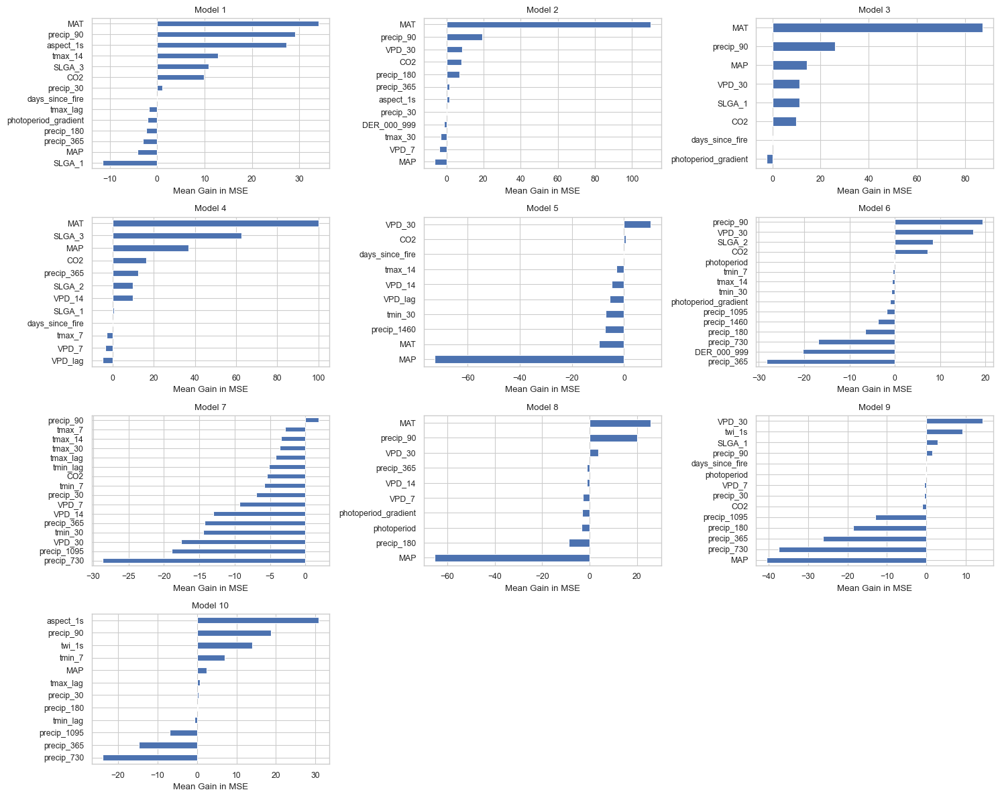

In [218]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))

for i, ax in enumerate(axes.flat):
    
    if i < 10:
        folder_num = i + 1
        per_importance = pd.read_csv(f'{var_path}/KFold_{folder_num}_RF_VariableImportance.csv', index_col = 0)
        per_importance['importances_mean'].plot.barh(ax = ax)
        #ax.grid(True)
        ax.set_xlabel('Mean Gain in MSE')
        ax.title.set_text(f'Model {folder_num}')
    else:
        ax.axis('off') 

plt.tight_layout()
fig.savefig(f'{plots_dir}/{super_group_folder_name}_Individual_Model_Importances.png')

### Aggregating the Group Variable Means by the average score

In [9]:
number_of_folds = 10
variable_common_rank = dict() 

# Give features that were not in the model a score of 0 

for f in range(number_of_folds):
    folder_num = f + 1
    per_importance = pd.read_csv(f'{var_path}/KFold_{folder_num}_RF_VariableImportance.csv')
    per_importance = per_importance.sort_values('importances_mean', ascending = False).reset_index(drop = True)
    per_importance['rank'] = per_importance.index
    
    feature_track = []
    for i, row in per_importance.iterrows():
        var = row['Unnamed: 0']
        
        rank = row['importances_mean']
        #print(var)
        if var in variable_common_rank.keys():
            variable_common_rank[var].append(rank)
        else:
             variable_common_rank[var] = [rank]
                
        feature_track.append(var)       
    
    features_not_found = []
    for var in FEATURES:
        if var not in feature_track:

            if var in variable_common_rank.keys():
                variable_common_rank[var].append(0)
            else:
                variable_common_rank[var] = [0]
            features_not_found.append(var)
    
    print(f'{features_not_found} was not found in Model {f+1}')

['photoperiod', 'photoperiod_gradient', 'precip_30', 'precip_180', 'precip_730', 'precip_1095', 'precip_1460', 'VPD_lag', 'VPD_14', 'days_since_fire', 'fire_severity', 'tmax_lag', 'tmax_7', 'tmax_14', 'tmin_lag', 'tmin_7', 'tmin_14', 'tmin_30', 'SLGA_1', 'SLGA_2', 'twi_1s'] was not found in Model 1
['photoperiod', 'photoperiod_gradient', 'precip_30', 'precip_90', 'precip_180', 'precip_365', 'precip_730', 'precip_1095', 'precip_1460', 'VPD_7', 'days_since_fire', 'CO2', 'tmax_lag', 'tmax_7', 'tmin_lag', 'tmin_7', 'tmin_30', 'SLGA_1', 'SLGA_2', 'DER_000_999', 'twi_1s'] was not found in Model 2
['photoperiod_gradient', 'precip_30', 'precip_730', 'precip_1095', 'precip_1460', 'VPD_lag', 'VPD_14', 'days_since_fire', 'fire_severity', 'tmax_lag', 'tmax_7', 'tmax_14', 'tmax_30', 'tmin_lag', 'tmin_14', 'tmin_30', 'SLGA_1', 'SLGA_3', 'DER_000_999', 'twi_1s'] was not found in Model 3
['photoperiod', 'photoperiod_gradient', 'precip_30', 'precip_365', 'precip_730', 'precip_1095', 'precip_1460', 'VPD

In [10]:
collapsed_importances = dict()
for key, value in variable_common_rank.items():
    collapsed_importances[key] =  np.mean(value)
    
collapsed_importance = pd.DataFrame.from_dict(collapsed_importances, orient = 'index')  
collapsed_importance = collapsed_importance.sort_values(0)


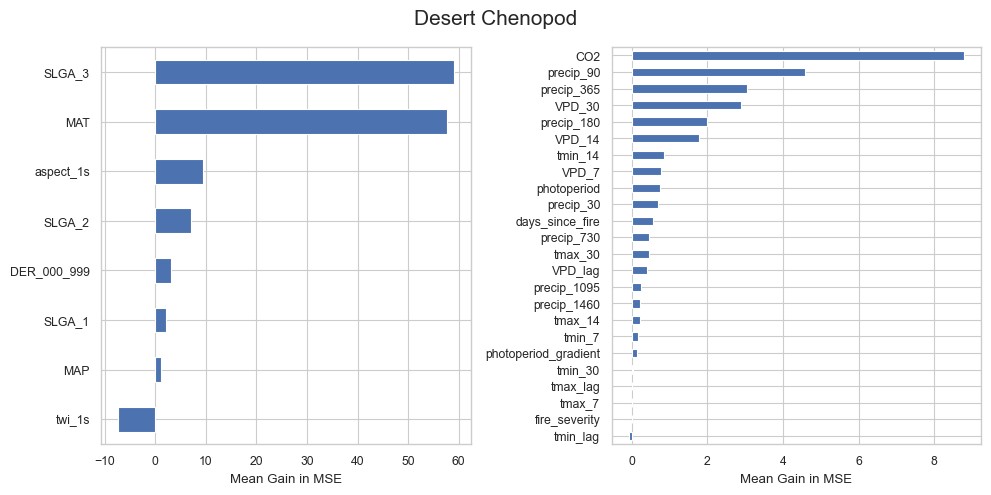

In [11]:
number_of_folds = 10
fig, axes = plt.subplots(ncols= 2, figsize = (10,5))


spatial = collapsed_importance.iloc[collapsed_importance.index.isin(SPATIAL_FEATURES)]
spatial[0].plot.barh(ax = axes[0], legend=False)

temporal = collapsed_importance.iloc[collapsed_importance.index.isin(TEMPORAL_FEATURES)]
temporal.plot.barh(ax = axes[1], legend=False)

for ax in axes.flat:
    ax.grid(True)
    ax.set_xlabel('Mean Gain in MSE')

fig.suptitle(f'{super_group_folder_name}', fontsize = 15)
plt.tight_layout()
fig.savefig(f'{plots_dir}/{super_group_folder_name}_Aggregated_Model_Importances.png')

## Assessing the Predictions

In [12]:
number_of_folds = 10
test_set = pd.read_csv(test_pred_path, parse_dates = ['time']).set_index('time').sort_values('time')

predictor_names_pv = [f'pv_filter_prediction_{j + 1}' for j in range(number_of_folds)]
pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
test_set['pv_median'] = pv_summaries['50%'].values
test_set['pv_mean'] = pv_summaries['mean'].values
test_set['pv_lower'] = pv_summaries['2.5%'].values
test_set['pv_upper'] = pv_summaries['97.5%'].values

predictor_names_pv = [f'npv_filter_prediction_{j + 1}' for j in range(number_of_folds)]
pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
test_set['npv_median'] = pv_summaries['50%'].values
test_set['npv_mean'] = pv_summaries['mean'].values
test_set['npv_lower'] = pv_summaries['2.5%'].values
test_set['npv_upper'] =  pv_summaries['97.5%'].values

predictor_names_pv = [f'bs_filter_prediction_{j + 1}' for j in range(number_of_folds)]
pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
test_set['bs_median'] = pv_summaries['50%'].values
test_set['bs_mean'] = pv_summaries['mean'].values
test_set['bs_lower'] = pv_summaries['2.5%'].values
test_set['bs_upper'] = pv_summaries['97.5%'].values

In [13]:
print('Mean MSEs')
pv_mean_rmse = round(root_mean_squared_error(test_set['pv_mean'], test_set['pv_filter']),3)
npv_mean_rmse = round(root_mean_squared_error(test_set['npv_mean'], test_set['npv_filter']),3)
bs_mean_rmse = round(root_mean_squared_error(test_set['bs_mean'], test_set['bs_filter']),3)

print(f'PV: {pv_mean_rmse}')
print(f'NPV: {npv_mean_rmse}')
print(f'BS: {bs_mean_rmse}')

Mean MSEs
PV: 4.918
NPV: 11.434
BS: 12.761


In [14]:
TARGET = ['pv_filter', 'npv_filter', 'bs_filter'] # Only needed target variables 

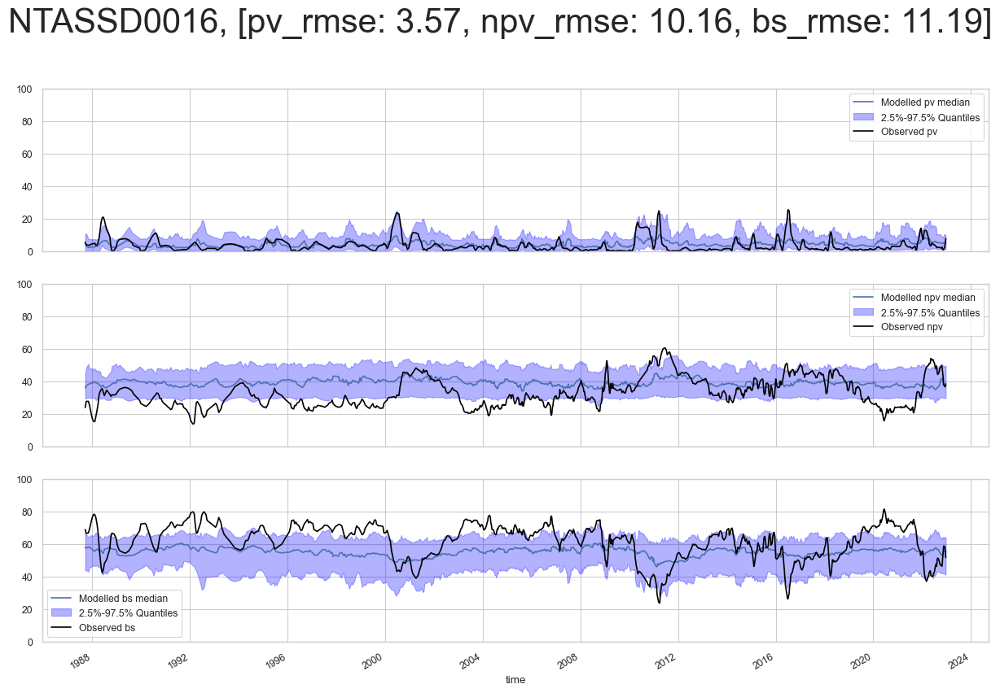

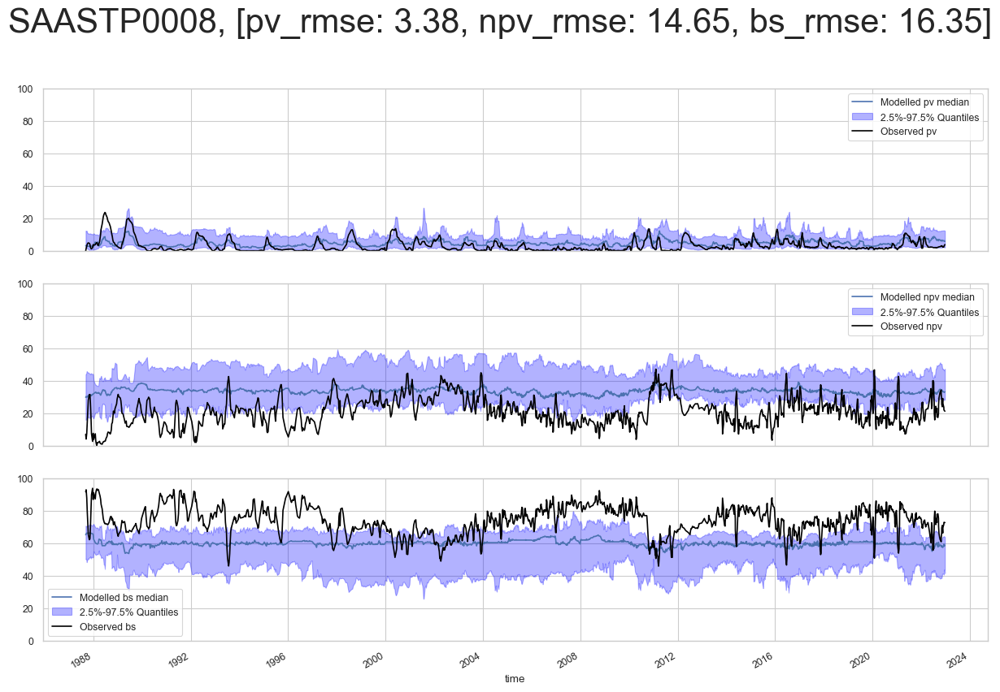

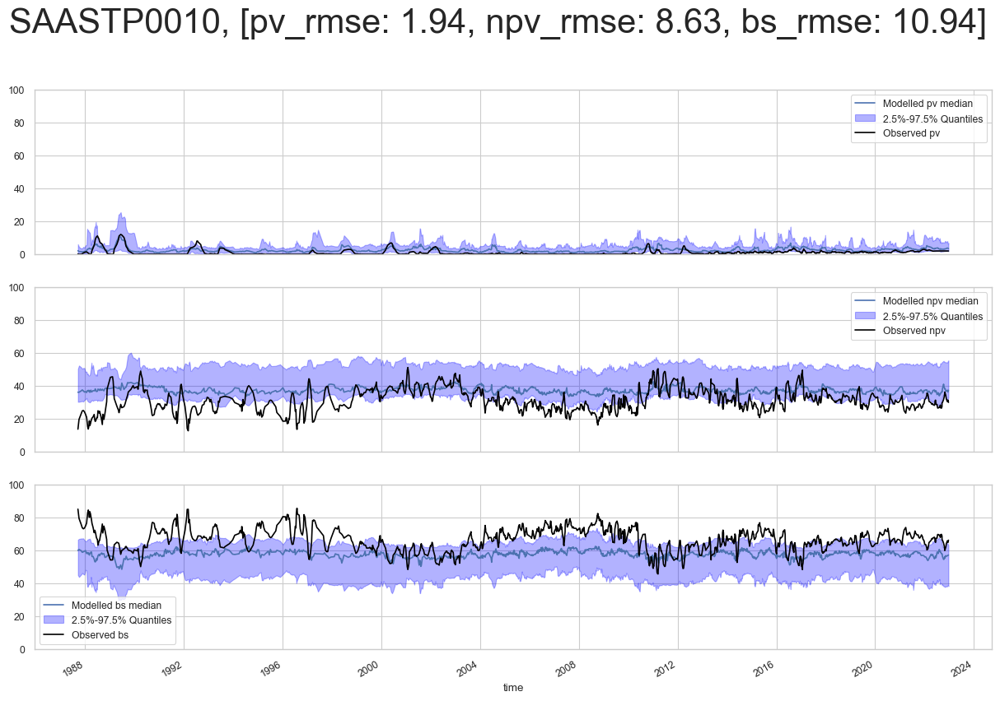

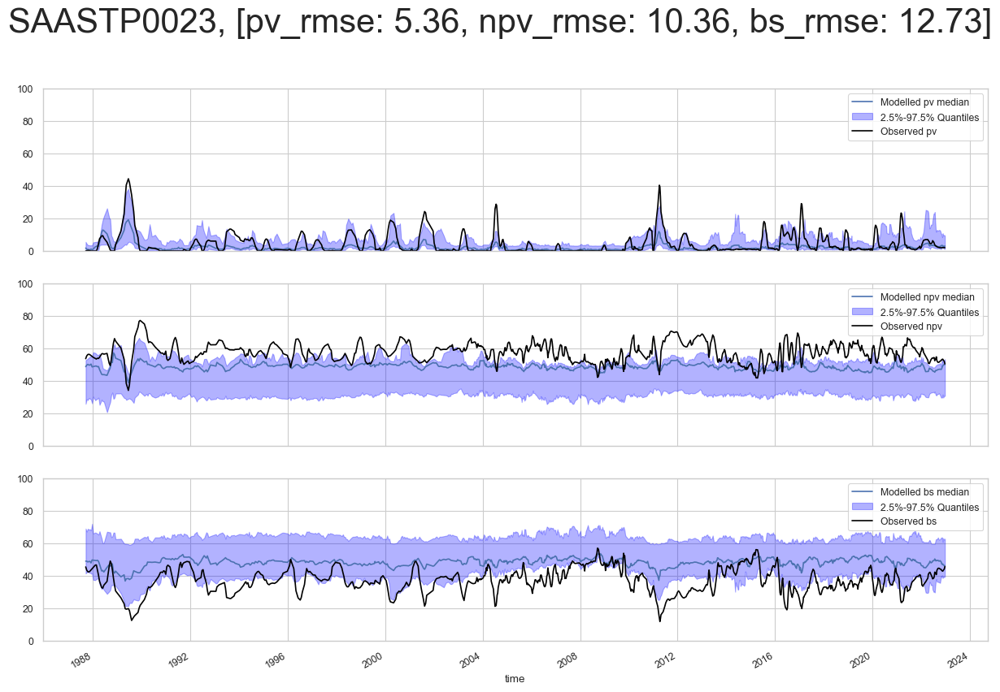

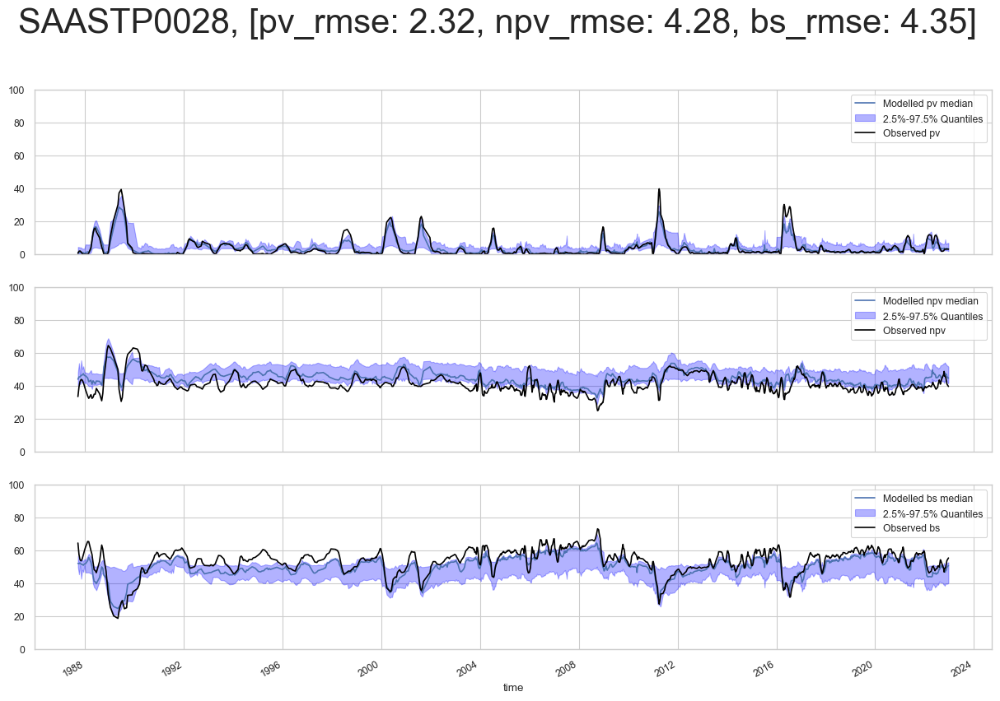

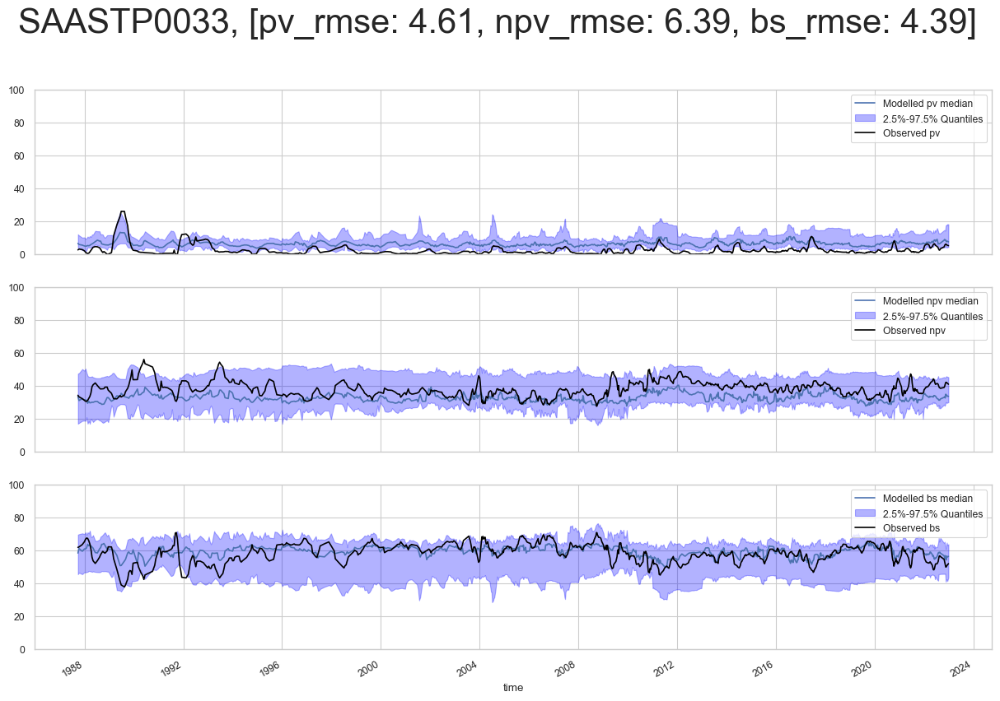

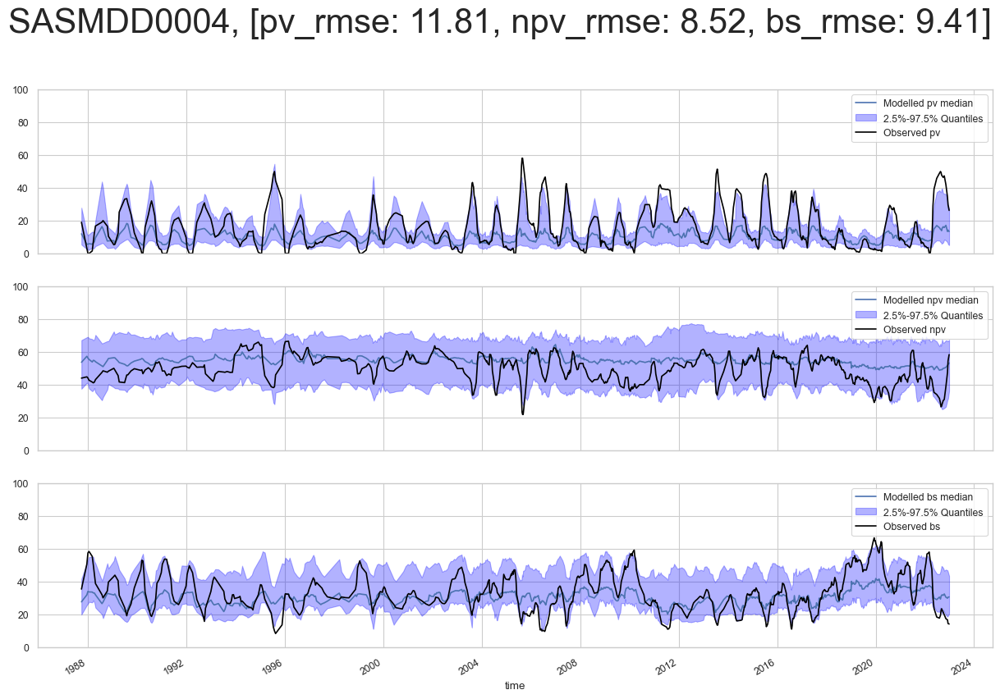

In [15]:
sites_unique = np.unique(test_set['site_location_name'])


for sit in sites_unique:
    
    site_specific = test_set[test_set['site_location_name'] == sit]
    
    
    site_pv_rmse = round(root_mean_squared_error(site_specific['pv_median'], site_specific['pv_filter']),2)
    site_npv_rmse = round(root_mean_squared_error(site_specific['npv_median'], site_specific['npv_filter']),2)
    site_bs_rmse = round(root_mean_squared_error(site_specific['bs_median'], site_specific['bs_filter']),2)
    
    #plotPredictions(test_set[test_set['site_location_name'] == sit], n_folds = number_of_folds,
    #                TARGET = TARGET, msg = f'{sit}, [pv_rmse: {site_pv_rmse}, npv_rmse: {site_npv_rmse}, bs_rmse: {site_bs_rmse}]')
    #
    plotMedianPredictions(test_set[test_set['site_location_name'] == sit], n_folds = number_of_folds,
                          TARGET = TARGET, msg = f'{sit}, [pv_rmse: {site_pv_rmse}, npv_rmse: {site_npv_rmse}, bs_rmse: {site_bs_rmse}]',
                          directory_plot_output = f'{plots_dir}/{super_group_folder_name}_{sit}_Median_Predictions.png')


### Inspect Linear Alignment

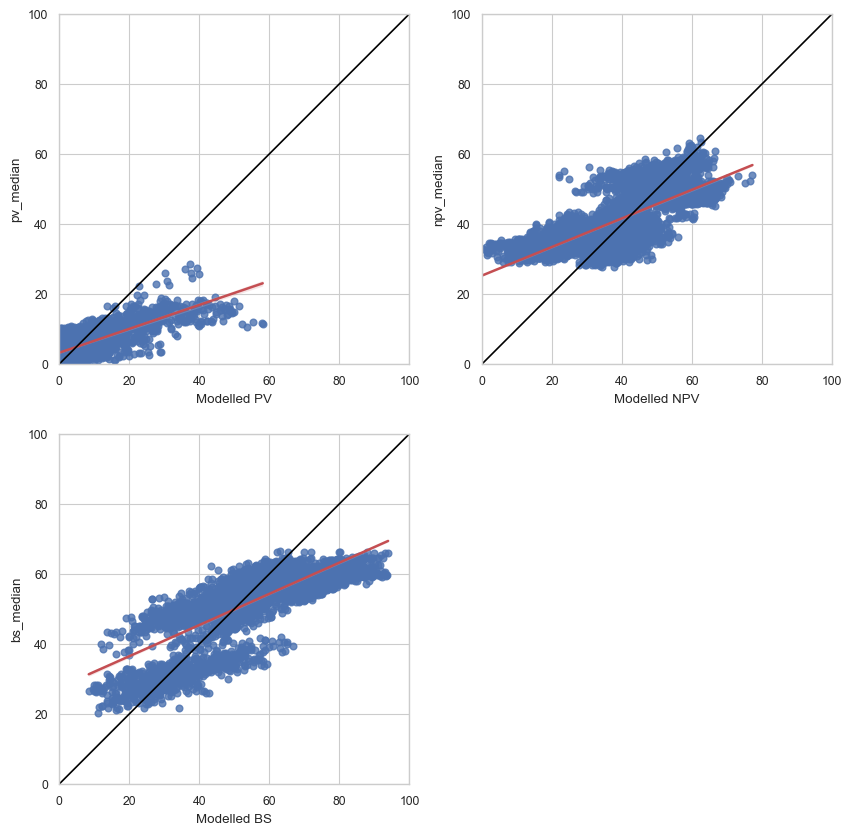

In [16]:

fig, axes = plt.subplots(nrows = 2, ncols= 2, figsize = (10,10))
fractions = ['pv', 'npv', 'bs']

for i, ax in enumerate(axes.flat):
    
    if i < 3:
        one_to_one = [i for i in range(101)]
        sns.regplot(data = test_set, x = f'{fractions[i]}_filter', y = f'{fractions[i]}_median', ax = ax, line_kws=dict(color="r"))
        ax.plot(one_to_one,one_to_one, color = 'black')
        ax.grid(True)
        ax.set_xlabel(f'{fractions[i].upper()}')
        ax.set_xlabel(f'Modelled {fractions[i].upper()}')
        
        ax.set_xlim([0, 100])
        ax.set_ylim([0, 100])
        ax.set_aspect('equal')

    else:
        ax.axis('off') 


# Aggregating Figures Across The Vegetation Groups

In [176]:
import numpy as np
import pandas as pd
import os 
import sys
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.metrics import root_mean_squared_error, mean_squared_error
from scipy.stats import gaussian_kde

import seaborn as sns
sns.set()
sns.set_style("whitegrid") 
sns.set_context("paper")

In [177]:
results_dir = 'E:/Krish_New/Dynamic_Vegetation_Project_Storage/Random_Forest_Results_On_Super_Group_Results'
results_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/RESULTS/Random_Forest_Results_On_Super_Group_Results_new'
directory = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/DATASETS/MODELLED_TRAINING_DATA'
plots_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/Thesis/Plots_For_Thesis/Chapter 3'

In [249]:
SEASONAL_FEATURES = ['photoperiod', 'photoperiod_gradient']

PRECIP_FEATURES = ['precip_30', 'precip_90', 'precip_180', 
                   'precip_365', 'precip_730', 'precip_1095', 
                   'precip_1460']

MEAN_ANNUAL_CLIMATE_FEATURES = ['MAT', 'MAP']

TEMP_FEATURES = ['tmax_lag', 'tmax_7', 'tmax_14', 
                 'tmax_30', 'tmin_lag', 'tmin_7', 
                 'tmin_14', 'tmin_30']

VPD_FEATURES = ['VPD_lag','VPD_7', 'VPD_14',
                'VPD_30']

FIRE_FEATURES = ['days_since_fire', 'fire_severity']

CO2_FEATURES = ['CO2']

SOIL_FEATURES = ['SLGA_1','SLGA_2','SLGA_3', 'DER_000_999'] # the soil attributes to include

TOPOGRAPHIC_FEATURES = ['aspect_1s', 'twi_1s']

FEATURES =  SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES + SOIL_FEATURES + TOPOGRAPHIC_FEATURES

TEMPORAL_FEATURES = SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES
SPATIAL_FEATURES = SOIL_FEATURES + TOPOGRAPHIC_FEATURES + MEAN_ANNUAL_CLIMATE_FEATURES

In [250]:
super_group_list = ['Desert Chenopod', 'Desert Forb', 'Desert Hummock.grass',
       'Desert Shrub', 'Desert Tree.Palm', 'Desert Tussock.grass',
       'Temp/Med Shrub', 'Temp/Med Tree.Palm', 'Temp/Med Tussock.grass',
       'Tropical/Savanna Tree.Palm', 'Tropical/Savanna Tussock.grass']

In [180]:
chosen_super_group = super_group_list[0]
super_group_folder_name = '_'.join(chosen_super_group.split('/')) 
print(f'Looking at {super_group_folder_name}')

Looking at Desert Chenopod


In [181]:
var_path = f'{results_dir}/{super_group_folder_name}/Results/Variable_Importances'
test_pred_path = f'{results_dir}/{super_group_folder_name}/Results/Test_Predictions/test_predictions.csv'

## Evaluation Metrics

In [44]:
number_of_folds = 10
test_datasets = [] 

for super_group_name in super_group_list:
    
    super_group_folder_name = '_'.join(super_group_name.split('/')) 
    print(super_group_folder_name)
    
    test_pred_path = f'{results_dir}/{super_group_folder_name}/Results/Test_Predictions/test_predictions.csv'
    test_set = pd.read_csv(test_pred_path, parse_dates = ['time']).set_index('time').sort_values('time')

    predictor_names_pv = [f'pv_filter_prediction_{j + 1}' for j in range(number_of_folds)]
    pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
    test_set['pv_median'] = pv_summaries['50%'].values
    test_set['pv_mean'] = pv_summaries['mean'].values
    test_set['pv_lower'] = pv_summaries['2.5%'].values
    test_set['pv_upper'] = pv_summaries['97.5%'].values

    predictor_names_pv = [f'npv_filter_prediction_{j + 1}' for j in range(number_of_folds)]
    pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
    test_set['npv_median'] = pv_summaries['50%'].values
    test_set['npv_mean'] = pv_summaries['mean'].values
    test_set['npv_lower'] = pv_summaries['2.5%'].values
    test_set['npv_upper'] =  pv_summaries['97.5%'].values

    predictor_names_pv = [f'bs_filter_prediction_{j + 1}' for j in range(number_of_folds)]
    pv_summaries = test_set[predictor_names_pv].T.describe(percentiles = [0.025, 0.5, 0.975]).T
    test_set['bs_median'] = pv_summaries['50%'].values
    test_set['bs_mean'] = pv_summaries['mean'].values
    test_set['bs_lower'] = pv_summaries['2.5%'].values
    test_set['bs_upper'] = pv_summaries['97.5%'].values
    
    test_set['group_name'] = super_group_name
    test_datasets.append(test_set)

Desert Chenopod
Desert Forb
Desert Hummock.grass
Desert Shrub
Desert Tree.Palm
Desert Tussock.grass
Temp_Med Shrub
Temp_Med Tree.Palm
Temp_Med Tussock.grass
Tropical_Savanna Tree.Palm
Tropical_Savanna Tussock.grass


In [45]:
test_evaluation_set = pd.concat(test_datasets)

In [46]:
test_evaluation_set.to_csv('../RESULTS/Random_Forest_Results_On_Super_Group_Results_new/Evaluation_Plot.csv')

In [6]:
test_evaluation_set = pd.read_csv('../RESULTS/Random_Forest_Results_On_Super_Group_Results_new/Evaluation_Plot.csv')

In [7]:
ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

In [33]:
sns.color_palette("husl", 3)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.3126890019504329, 0.6928754610296064, 0.1923704830330379),
 (0.23299120924703914, 0.639586552066035, 0.9260706093977744)]

In [58]:
sns.color_palette("husl", 10)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.8616090647292522, 0.536495730113334, 0.19548899031476086),
 (0.6804189127793346, 0.6151497514677574, 0.19405452111445337),
 (0.46810256823426105, 0.6699492535792404, 0.1928958739904499),
 (0.20125317221201128, 0.6907920815379025, 0.47966761189275336),
 (0.21044753832183283, 0.6773105080456748, 0.6433941168468681),
 (0.2197995660828324, 0.6625157876850336, 0.7732093159317209),
 (0.433280341176423, 0.6065273407962815, 0.9585467098271748),
 (0.8004936186423958, 0.47703363533737203, 0.9579547196007522),
 (0.962272393509669, 0.3976451968965351, 0.8008274363432775)]

### PV

Desert Forb
Desert Chenopod
Desert Hummock.grass
Desert Tree.Palm
Desert Shrub
Desert Tussock.grass
Temp/Med Tree.Palm
Temp/Med Shrub
Temp/Med Tussock.grass
Tropical/Savanna Tree.Palm
Tropical/Savanna Tussock.grass


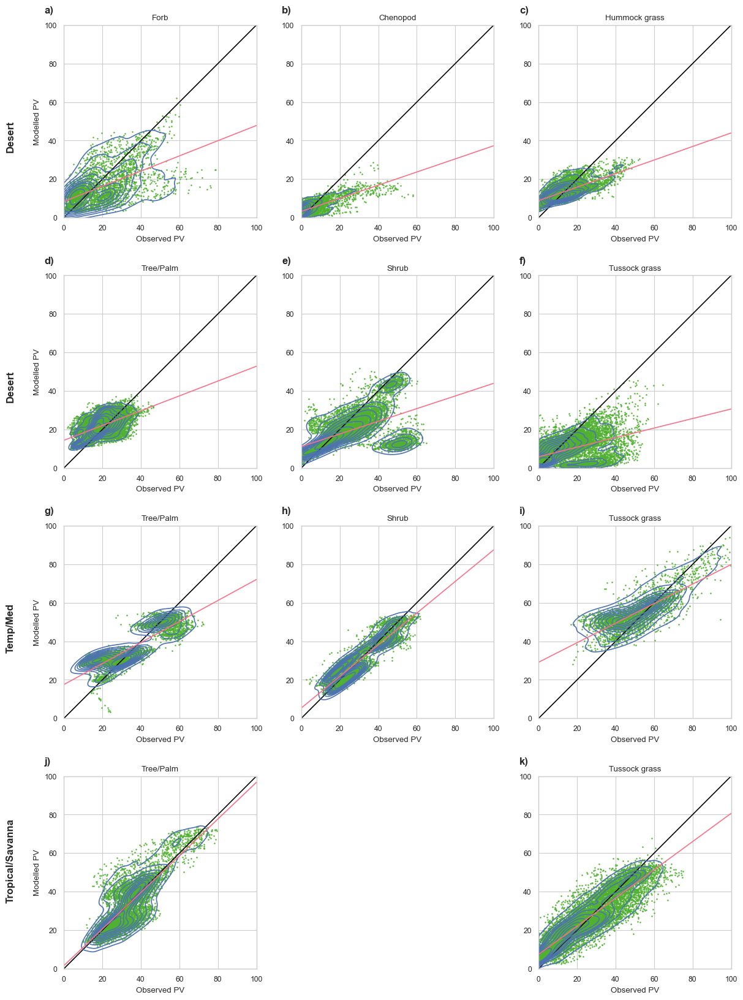

In [88]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']
one_to_one = [i for i in range(101)]

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]
        
    print(chosen_group)
    
    # Plot the points 
    test_evaluation_set_group = test_evaluation_set.loc[test_evaluation_set['group_name'] == chosen_group]
    test_evaluation_set_group.plot(kind = 'scatter', x = 'pv_filter', y = 'pv_median', ax = ax, s = 0.9, **{'color' : list(sns.color_palette("husl", 3))[1], 'alpha' : 1} )
    ax.plot(one_to_one,one_to_one, color = 'black')
    
    #Add density contours 
    sns.kdeplot(x= test_evaluation_set_group['pv_filter'],
                y= test_evaluation_set_group['pv_median'], ax = ax)
    
    # Plot a regression equation 
    slope, intercept, r, p, se = stats.linregress(x = test_evaluation_set_group['pv_filter'], y = test_evaluation_set_group['pv_median'])
    ax.plot(np.array(one_to_one), np.array(one_to_one)*slope + intercept, **{'color' : list(sns.color_palette("husl", 3))[0]})
    
    
    # x and y limits 
    ax.set_xlim((0,100))
    ax.set_ylim((0,100))
    ax.set_aspect('equal')
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel('Modelled PV') 
        ax.text(-0.3, 0.35, chosen_group.split(" ")[0], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', rotation=90)
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Observed PV')
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
#plt.tight_layout()

In [89]:
fig.savefig(f'{plots_dir}/Total_PV_Evaluation_Plot.png')

### NPV

Desert Forb
Desert Chenopod
Desert Hummock.grass
Desert Tree.Palm
Desert Shrub
Desert Tussock.grass
Temp/Med Tree.Palm
Temp/Med Shrub
Temp/Med Tussock.grass
Tropical/Savanna Tree.Palm
Tropical/Savanna Tussock.grass


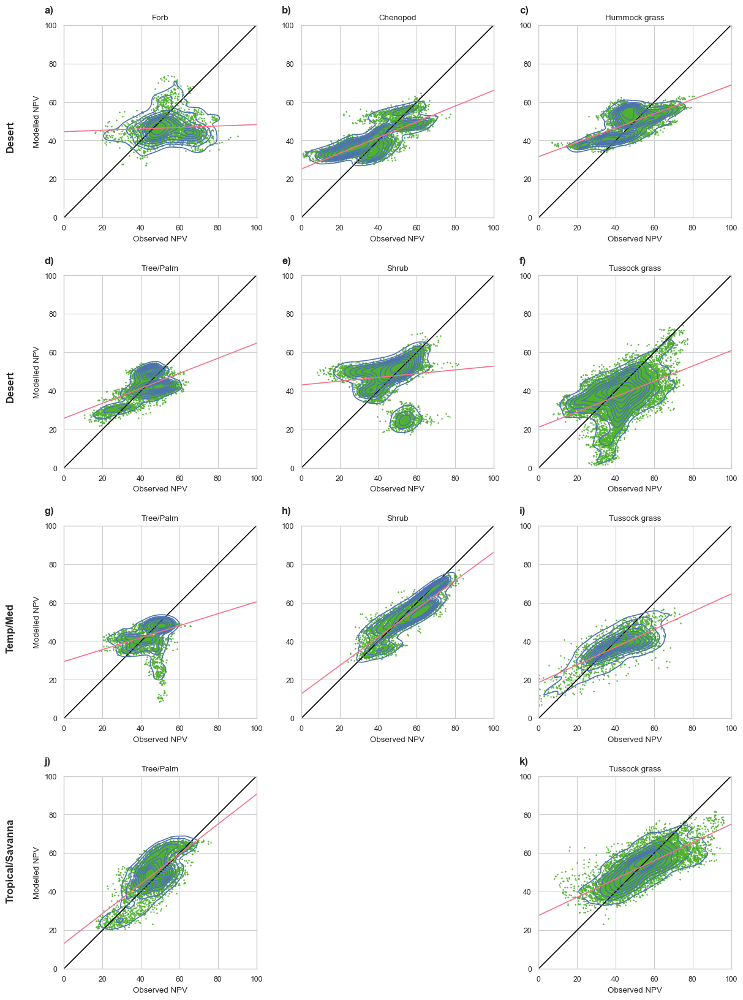

In [90]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']
one_to_one = [i for i in range(101)]

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]
        
    print(chosen_group)
    
    # Plot the points 
    test_evaluation_set_group = test_evaluation_set.loc[test_evaluation_set['group_name'] == chosen_group]
    test_evaluation_set_group.plot(kind = 'scatter', x = 'npv_filter', y = 'npv_median', ax = ax, s = 0.9, **{'color' : list(sns.color_palette("husl", 3))[1], 'alpha' : 1} )
    ax.plot(one_to_one,one_to_one, color = 'black')
    
    # Add density contours 
    sns.kdeplot(x= test_evaluation_set_group['npv_filter'],
                y= test_evaluation_set_group['npv_median'], ax = ax)
    
    
        # Plot a regression equation 
    slope, intercept, r, p, se = stats.linregress(x = test_evaluation_set_group['npv_filter'], y = test_evaluation_set_group['npv_median'])
    ax.plot(np.array(one_to_one), np.array(one_to_one)*slope + intercept, **{'color' : list(sns.color_palette("husl", 3))[0]})
    
    
    # x and y limits 
    ax.set_xlim((0,100))
    ax.set_ylim((0,100))
    ax.set_aspect('equal')
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel('Modelled NPV') 
        ax.text(-0.3, 0.35, chosen_group.split(" ")[0], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', rotation=90)
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Observed NPV')
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
#plt.tight_layout()

In [92]:
fig.savefig(f'{plots_dir}/Total_NPV_Evaluation_Plot.png')

### BS

Desert Forb
Desert Chenopod
Desert Hummock.grass
Desert Tree.Palm
Desert Shrub
Desert Tussock.grass
Temp/Med Tree.Palm
Temp/Med Shrub
Temp/Med Tussock.grass
Tropical/Savanna Tree.Palm
Tropical/Savanna Tussock.grass


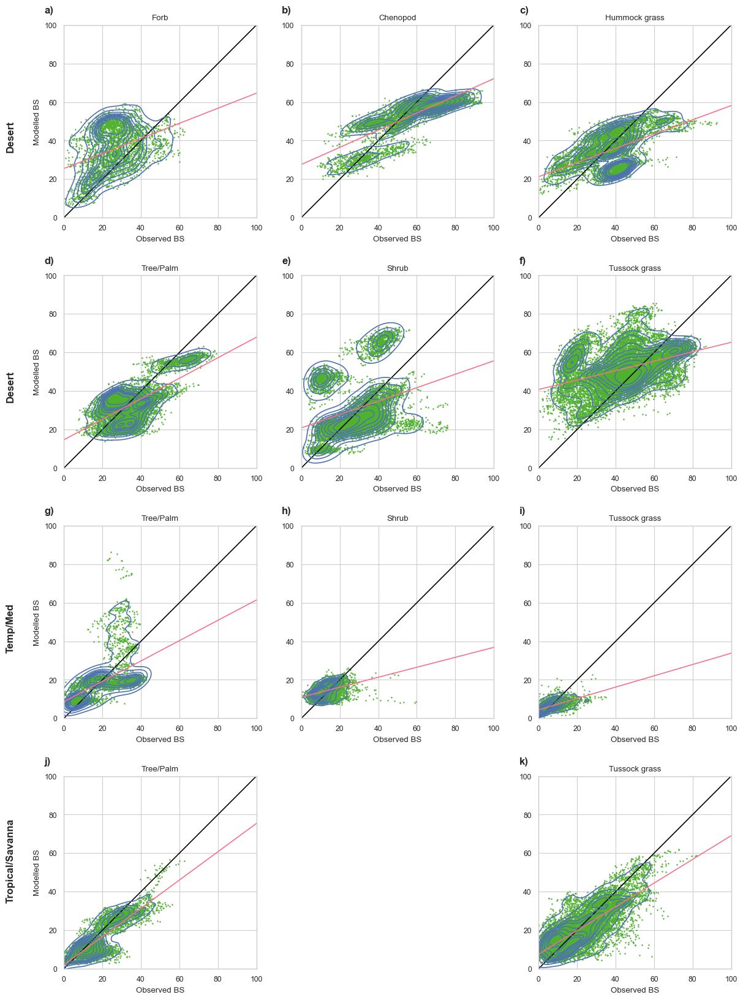

In [93]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']
one_to_one = [i for i in range(101)]

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]
        
    print(chosen_group)
    
    # Plot the points 
    test_evaluation_set_group = test_evaluation_set.loc[test_evaluation_set['group_name'] == chosen_group]
    test_evaluation_set_group.plot(kind = 'scatter', x = 'bs_filter', y = 'bs_median', ax = ax, s = 0.9, **{'color' : list(sns.color_palette("husl", 3))[1], 'alpha' : 1} )
    ax.plot(one_to_one,one_to_one, color = 'black')
    
    # Add density contours 
    sns.kdeplot(x= test_evaluation_set_group['bs_filter'],
                y= test_evaluation_set_group['bs_median'], ax = ax)
    
    
        # Plot a regression equation 
    slope, intercept, r, p, se = stats.linregress(x = test_evaluation_set_group['bs_filter'], y = test_evaluation_set_group['bs_median'])
    ax.plot(np.array(one_to_one), np.array(one_to_one)*slope + intercept, **{'color' : list(sns.color_palette("husl", 3))[0]})
    
    
    # x and y limits 
    ax.set_xlim((0,100))
    ax.set_ylim((0,100))
    ax.set_aspect('equal')
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel('Modelled BS') 
        ax.text(-0.3, 0.35, chosen_group.split(" ")[0], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', rotation=90)
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Observed BS')
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
#plt.tight_layout()

In [94]:
fig.savefig(f'{plots_dir}/Total_BS_Evaluation_Plot.png')

## Spatial and Temporal Variable Importances

In [251]:
number_of_folds = 10


veg_group_agg_importances = [] 

# Loop through all vegetation groups 
for chosen_super_group in super_group_list:
    
    super_group_folder_name = '_'.join(chosen_super_group.split('/')) 
    var_path = f'{results_dir}/{super_group_folder_name}/Results/Variable_Importances'
    print(super_group_folder_name)
    variable_common_rank = dict() 
    
    # Calculate the agg variable importances 
    for f in range(number_of_folds):
        folder_num = f + 1
        per_importance = pd.read_csv(f'{var_path}/KFold_{folder_num}_RF_VariableImportance.csv')
        per_importance = per_importance.sort_values('importances_mean', ascending = False).reset_index(drop = True)
        per_importance['rank'] = per_importance.index

        feature_track = []
        for i, row in per_importance.iterrows():
            var = row['Unnamed: 0']

            rank = row['importances_mean']
            #print(var)
            if var in variable_common_rank.keys():
                variable_common_rank[var].append(rank)
            else:
                 variable_common_rank[var] = [rank]

            feature_track.append(var)       

        features_not_found = []
        for var in FEATURES:
            if var not in feature_track:

                if var in variable_common_rank.keys():
                    variable_common_rank[var].append(0)
                else:
                    variable_common_rank[var] = [0]
                features_not_found.append(var)

        #print(f'{features_not_found} was not found in Model {f+1}')

    # Convert the data into a data frame     
    collapsed_importances = dict()
    for key, value in variable_common_rank.items():
        collapsed_importances[key] =  np.mean(value)
    collapsed_importance = pd.DataFrame.from_dict(collapsed_importances, orient = 'index')  
    collapsed_importance = collapsed_importance.sort_values(0)
    collapsed_importance['group'] = chosen_super_group
    
    # Append the dataframe to a list for future merging 
    veg_group_agg_importances.append(collapsed_importance)
    
# Concat all data into one dataframe
veg_group_agg_importances_df = pd.concat(veg_group_agg_importances) 
veg_group_agg_importances_df.to_csv(f'{results_dir}/Results_Visualisation/Aggregated_Importances.csv')

Desert Chenopod
Desert Forb
Desert Hummock.grass
Desert Shrub
Desert Tree.Palm
Desert Tussock.grass
Temp_Med Shrub
Temp_Med Tree.Palm
Temp_Med Tussock.grass
Tropical_Savanna Tree.Palm
Tropical_Savanna Tussock.grass


In [231]:
veg_group_agg_importances

[                                 0            group
 twi_1s               -7.306650e+00  Desert Chenopod
 tmin_lag             -8.304576e-02  Desert Chenopod
 fire_severity        -7.105427e-16  Desert Chenopod
 tmax_7                0.000000e+00  Desert Chenopod
 tmax_lag              0.000000e+00  Desert Chenopod
 tmin_30               2.461640e-02  Desert Chenopod
 photoperiod_gradient  1.442130e-01  Desert Chenopod
 tmin_7                1.734408e-01  Desert Chenopod
 tmax_14               2.196507e-01  Desert Chenopod
 precip_1460           2.265435e-01  Desert Chenopod
 precip_1095           2.353971e-01  Desert Chenopod
 VPD_lag               3.925576e-01  Desert Chenopod
 tmax_30               4.446071e-01  Desert Chenopod
 precip_730            4.595987e-01  Desert Chenopod
 days_since_fire       5.555332e-01  Desert Chenopod
 precip_30             7.001390e-01  Desert Chenopod
 photoperiod           7.386711e-01  Desert Chenopod
 VPD_7                 7.845712e-01  Desert Ch

In [253]:
ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

In [254]:
sns.color_palette("husl", 10)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.8616090647292522, 0.536495730113334, 0.19548899031476086),
 (0.6804189127793346, 0.6151497514677574, 0.19405452111445337),
 (0.46810256823426105, 0.6699492535792404, 0.1928958739904499),
 (0.20125317221201128, 0.6907920815379025, 0.47966761189275336),
 (0.21044753832183283, 0.6773105080456748, 0.6433941168468681),
 (0.2197995660828324, 0.6625157876850336, 0.7732093159317209),
 (0.433280341176423, 0.6065273407962815, 0.9585467098271748),
 (0.8004936186423958, 0.47703363533737203, 0.9579547196007522),
 (0.962272393509669, 0.3976451968965351, 0.8008274363432775)]

In [255]:
color_pallete = list(sns.color_palette("husl", 10))

In [256]:
## Determine color code for each variable

variable_groups = {'FIRE_FEATURES': [FIRE_FEATURES, 0], # temporal
                   'TOPOGRAPHIC_FEATURES': [TOPOGRAPHIC_FEATURES, 1], # spatial
                   'SOIL_FEATURES': [SOIL_FEATURES, 2], # spatial
                   'VPD_FEATURES': [VPD_FEATURES, 2], # temporal 
                   'SEASONAL_FEATURES': [SEASONAL_FEATURES, 3], # temporal
                   'TEMP_FEATURES':[TEMP_FEATURES, 1], # temporal
                   'MEAN_ANNUAL_CLIMATE_FEATURES': [MEAN_ANNUAL_CLIMATE_FEATURES, 7], # spatial
                   'CO2_FEATURES': [CO2_FEATURES, 5], 
                   'PRECIP_FEATURES': [PRECIP_FEATURES, 7]}

coloring_code = []
coloring_rbg = []


for var_name in veg_group_agg_importances_df.index:
    
    key_num = 0
    for i, v in variable_groups.items():
        #print(v[0])
        if var_name in v[0]:
            coloring_code.append(i)
            coloring_rbg.append(v[1])
        key_num += 1
    
veg_group_agg_importances_df['var_group'] = coloring_code
veg_group_agg_importances_df['color_code'] = coloring_rbg

#list(veg_group_agg_importances_df.index) 

In [257]:
veg_group_agg_importances_df

,0,group,var_group,color_code
twi_1s,-7.306650e+00,Desert Chenopod,TOPOGRAPHIC_FEATURES,1
tmin_lag,-8.304576e-02,Desert Chenopod,TEMP_FEATURES,1
fire_severity,-7.105427e-16,Desert Chenopod,FIRE_FEATURES,0
tmax_7,0.000000e+00,Desert Chenopod,TEMP_FEATURES,1
tmax_lag,0.000000e+00,Desert Chenopod,TEMP_FEATURES,1
...,...,...,...,...
precip_30,1.120708e+01,Tropical/Savanna Tussock.grass,PRECIP_FEATURES,7
precip_365,1.465313e+01,Tropical/Savanna Tussock.grass,PRECIP_FEATURES,7
CO2,1.682621e+01,Tropical/Savanna Tussock.grass,CO2_FEATURES,5
precip_90,6.374759e+01,Tropical/Savanna Tussock.grass,PRECIP_FEATURES,7


In [258]:
# Rename some variables so they are reader-friendly 

rename_dictionary = {
    'twi_1s': 'TWI',
    'DER_000_999' : 'DER',
    'aspect_1s' : 'aspect_slope'
}
veg_group_agg_importances_df['replace_name'] = veg_group_agg_importances_df.index

name_replacement = []
for var_name in np.unique(veg_group_agg_importances_df['replace_name']):
    for i, v in rename_dictionary.items():
        if var_name == i:
            veg_group_agg_importances_df.loc[veg_group_agg_importances_df['replace_name'] == var_name, 'replace_name'] = v

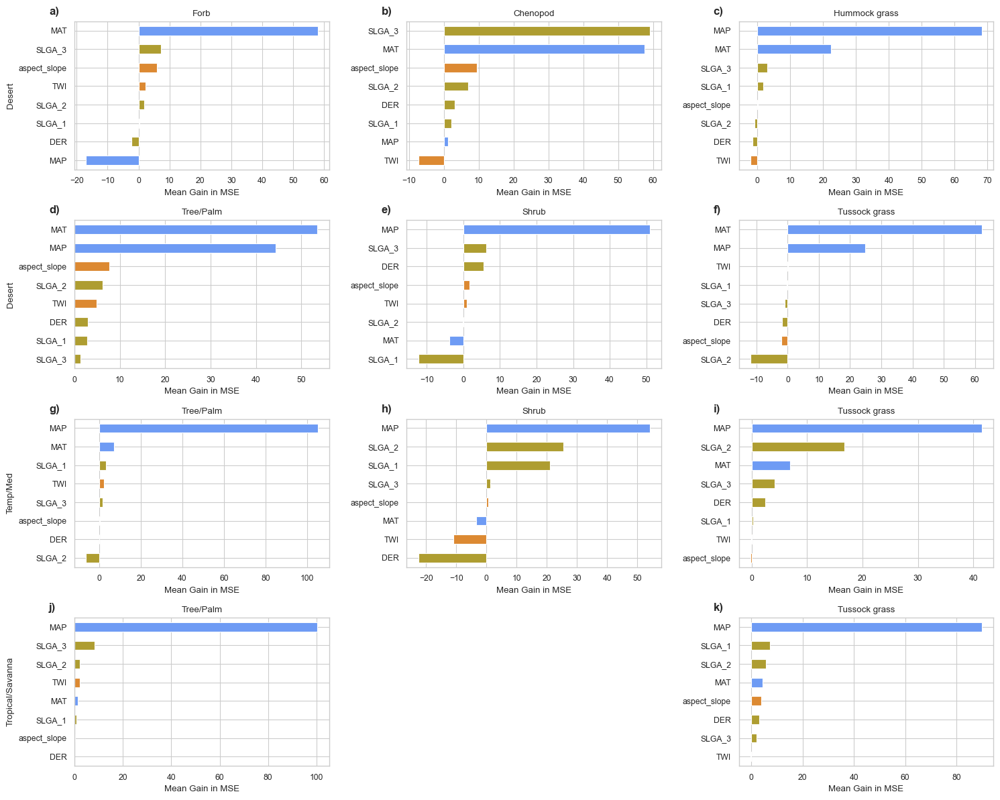

In [259]:
## Spatial features

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']

veg_group_agg_spatial = veg_group_agg_importances_df.iloc[veg_group_agg_importances_df.index.isin(SPATIAL_FEATURES)].set_index('replace_name')

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]

    veg_group_agg_spatial_group = veg_group_agg_spatial.loc[veg_group_agg_spatial['group'] == chosen_group]
    color_codes = [color_pallete[x] for x in veg_group_agg_spatial_group['color_code']]
    veg_group_agg_spatial_group[0].plot.barh(ax = ax, color =  color_codes)
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel(f'{chosen_group.split(" ")[0]}')
        
        
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Mean Gain in MSE')

plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Individual_Model_Importances_Spatial.png')

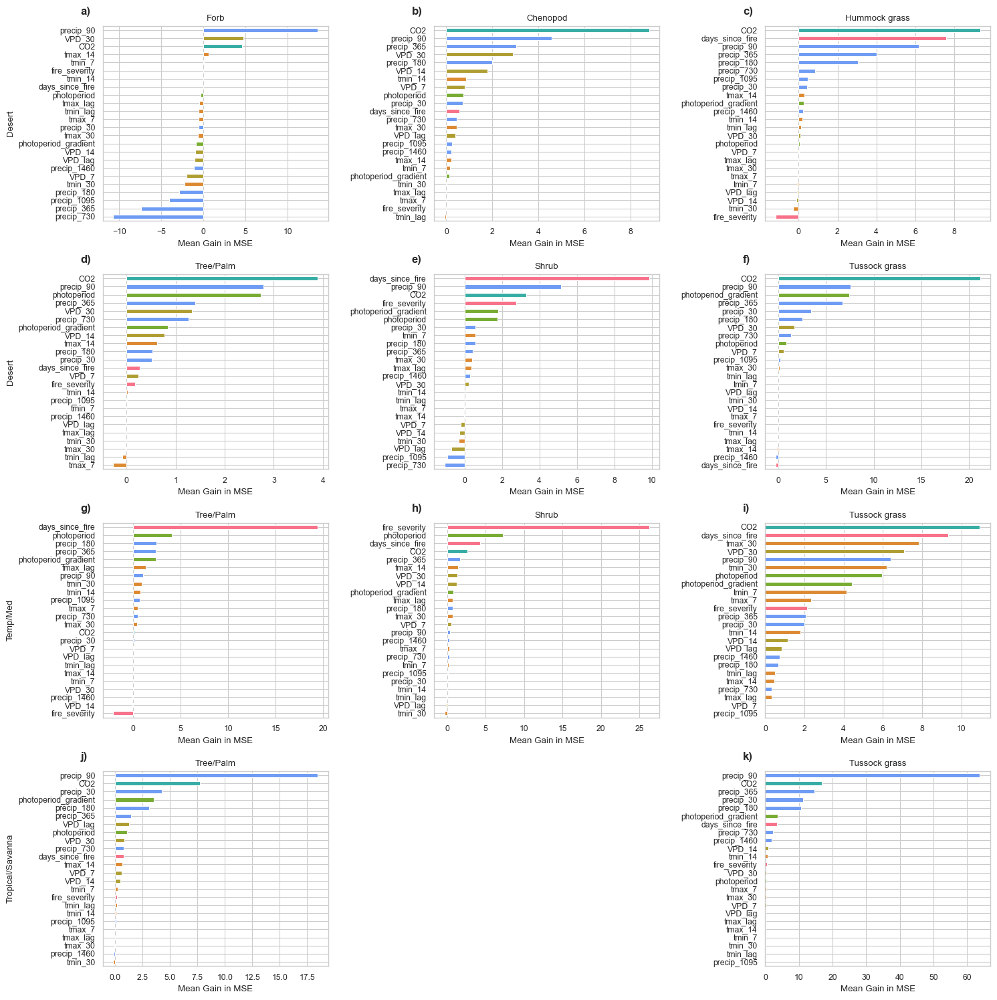

In [260]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))

veg_group_agg_spatial = veg_group_agg_importances_df.iloc[veg_group_agg_importances_df.index.isin(TEMPORAL_FEATURES)]
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]
    
    veg_group_agg_spatial_group = veg_group_agg_spatial.loc[veg_group_agg_spatial['group'] == chosen_group]
    color_codes = [color_pallete[x] for x in veg_group_agg_spatial_group['color_code']]
    veg_group_agg_spatial_group[0].plot.barh(ax = ax, color =  color_codes)
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel(f'{chosen_group.split(" ")[0]}')
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Mean Gain in MSE')

        
plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Individual_Model_Importances_Temporal.png')

# Seasonality Visualisation

In [96]:
import numpy as np
import pandas as pd
import os 
import sys
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.metrics import root_mean_squared_error, mean_squared_error
from scipy.stats import gaussian_kde

import seaborn as sns
sns.set()
sns.set_style("whitegrid") 
sns.set_context("paper")

In [97]:
results_dir = 'E:/Krish_New/Dynamic_Vegetation_Project_Storage/Random_Forest_Results_On_Super_Group_Results'
results_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/RESULTS/Random_Forest_Results_On_Super_Group_Results_new'
directory = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/DATASETS/MODELLED_TRAINING_DATA'
plots_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/Thesis/Plots_For_Thesis/Chapter 3'

In [98]:
super_group_list = ['Desert Chenopod', 'Desert Forb', 'Desert Hummock.grass',
       'Desert Shrub', 'Desert Tree.Palm', 'Desert Tussock.grass',
       'Temp/Med Shrub', 'Temp/Med Tree.Palm', 'Temp/Med Tussock.grass',
       'Tropical/Savanna Tree.Palm', 'Tropical/Savanna Tussock.grass']

In [99]:
chosen_super_group = super_group_list[0]
super_group_folder_name = '_'.join(chosen_super_group.split('/')) 
print(f'Looking at {super_group_folder_name}')

Looking at Desert Chenopod


In [103]:
training = pd.read_csv(f'{results_dir}/{super_group_folder_name}/Training/{super_group_folder_name}_Training_Set.csv')

In [104]:
training

,time,index,Unnamed: 0.1,Unnamed: 0,pv,npv,bs,ue,x,y,...,VPD_30,tmax_lag,tmax_7,tmax_14,tmax_30,tmin_lag,tmin_7,tmin_14,tmin_30,CO2
0,1987-09-02,0,0,1,1.000000,39.285714,58.285714,6.142857,5.680964e+05,-3.273325e+06,...,11.628535,17.832031,118.438477,142.072266,308.778320,4.971680,57.784180,22.498047,71.094727,348.25
1,1987-09-02,0,0,1,12.600000,53.100000,32.950000,8.950000,-1.747322e+06,-2.977666e+06,...,22.587281,23.210938,135.183594,158.408203,423.304688,15.537109,61.490234,78.539062,185.859375,348.25
2,1987-09-06,0,0,1,4.619048,30.904762,62.619048,10.000000,-1.256528e+06,-2.513451e+06,...,30.417806,28.382812,178.860352,182.492188,429.623047,10.445312,81.692383,71.621094,172.655273,348.25
3,1987-09-07,0,0,1,13.700000,53.900000,30.950000,6.700000,8.340000e+03,-3.371505e+06,...,12.372897,15.447266,105.545898,143.766602,303.567383,10.665039,56.771484,49.868164,103.939453,348.25
4,1987-09-07,0,0,1,9.833333,19.791667,68.750000,6.458333,1.381325e+05,-2.789568e+06,...,17.417035,19.704102,138.321289,164.346680,326.605469,6.055664,56.402344,49.224609,62.961914,348.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60278,2022-12-30,868,868,870,10.666667,36.333333,51.291667,9.333333,3.367675e+05,-3.327762e+06,...,41.258971,31.249023,225.603516,233.053711,517.180664,14.741211,128.696289,129.487305,255.518555,416.49
60279,2022-12-31,724,724,725,12.375000,38.250000,47.687500,8.500000,-6.390300e+05,-3.248460e+06,...,41.402466,36.064453,218.273438,220.458008,539.461914,16.184570,115.200195,118.975586,279.540039,416.49
60280,2022-12-31,1672,1672,1675,11.100000,52.800000,34.650000,8.600000,-1.747322e+06,-2.977666e+06,...,35.308108,38.172852,237.068359,287.161133,540.987305,20.234375,125.223633,144.458984,293.933594,416.49
60281,2022-12-31,1348,1348,1351,10.565217,41.000000,46.739130,8.043478,4.865602e+05,-3.606855e+06,...,27.611697,29.077148,197.702148,211.348633,441.801758,14.543945,104.633789,121.858398,222.113281,416.49


In [105]:
test = pd.read_csv(f'{results_dir}/{super_group_folder_name}/Training/{super_group_folder_name}_Test_Set.csv')

In [106]:
test

,time,index,Unnamed: 0.1,Unnamed: 0,pv,npv,bs,ue,x,y,...,VPD_30,tmax_lag,tmax_7,tmax_14,tmax_30,tmin_lag,tmin_7,tmin_14,tmin_30,CO2
0,1987-09-07,0,0,1,7.400000,57.640000,33.480000,8.520000,12765.000000,-3.354585e+06,...,12.821607,15.655273,107.278320,145.497070,306.714844,10.653320,57.792969,50.109375,103.760742,348.25
1,1987-09-09,0,0,1,0.750000,9.450000,88.600000,4.000000,373545.000000,-2.861520e+06,...,20.357897,22.391602,149.702148,167.864258,365.082031,5.017578,64.608398,63.219727,86.231445,348.25
2,1987-09-09,0,0,1,0.200000,34.500000,64.200000,6.700000,438795.000000,-3.091890e+06,...,17.921502,21.930664,141.036133,156.911133,351.758789,6.595703,67.787109,67.937500,87.112305,348.25
3,1987-09-12,0,0,1,5.450000,32.100000,60.800000,5.650000,-389235.000000,-3.277590e+06,...,16.734716,28.242188,118.670898,140.783203,334.759766,6.559570,26.519531,41.529297,74.859375,348.25
4,1987-09-16,0,0,1,4.080000,25.440000,68.840000,6.040000,349755.000000,-2.719665e+06,...,23.635614,25.481445,153.936523,175.656250,385.781250,5.496094,42.206055,72.601562,114.612305,348.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,2022-12-26,1529,1529,1530,10.333333,29.500000,58.333333,6.500000,795866.666667,-3.511912e+06,...,30.984555,36.973633,198.463867,182.347656,470.809570,19.642578,115.288086,81.401367,236.722656,416.49
6758,2022-12-26,1492,1492,1493,8.850000,33.750000,55.650000,7.400000,-149085.000000,-3.190770e+06,...,40.308195,43.084961,193.458984,196.844727,535.088867,16.075195,96.179688,108.205078,264.109375,416.49
6759,2022-12-27,1622,1622,1623,5.500000,40.300000,52.600000,6.900000,991965.000000,-3.378600e+06,...,38.874656,37.727539,202.098633,204.125977,504.535156,23.921875,127.351562,103.483398,275.233398,416.49
6760,2022-12-30,820,820,822,4.909091,51.545455,42.363636,5.636364,335503.636364,-3.344093e+06,...,40.641210,31.063477,225.208984,232.272461,514.791992,14.433594,126.854492,128.529297,252.203125,416.49


In [107]:
full_data_set = pd.concat([training, test])

In [108]:
full_data_set

,time,index,Unnamed: 0.1,Unnamed: 0,pv,npv,bs,ue,x,y,...,VPD_30,tmax_lag,tmax_7,tmax_14,tmax_30,tmin_lag,tmin_7,tmin_14,tmin_30,CO2
0,1987-09-02,0,0,1,1.000000,39.285714,58.285714,6.142857,5.680964e+05,-3.273325e+06,...,11.628535,17.832031,118.438477,142.072266,308.778320,4.971680,57.784180,22.498047,71.094727,348.25
1,1987-09-02,0,0,1,12.600000,53.100000,32.950000,8.950000,-1.747322e+06,-2.977666e+06,...,22.587281,23.210938,135.183594,158.408203,423.304688,15.537109,61.490234,78.539062,185.859375,348.25
2,1987-09-06,0,0,1,4.619048,30.904762,62.619048,10.000000,-1.256528e+06,-2.513451e+06,...,30.417806,28.382812,178.860352,182.492188,429.623047,10.445312,81.692383,71.621094,172.655273,348.25
3,1987-09-07,0,0,1,13.700000,53.900000,30.950000,6.700000,8.340000e+03,-3.371505e+06,...,12.372897,15.447266,105.545898,143.766602,303.567383,10.665039,56.771484,49.868164,103.939453,348.25
4,1987-09-07,0,0,1,9.833333,19.791667,68.750000,6.458333,1.381325e+05,-2.789568e+06,...,17.417035,19.704102,138.321289,164.346680,326.605469,6.055664,56.402344,49.224609,62.961914,348.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,2022-12-26,1529,1529,1530,10.333333,29.500000,58.333333,6.500000,7.958667e+05,-3.511912e+06,...,30.984555,36.973633,198.463867,182.347656,470.809570,19.642578,115.288086,81.401367,236.722656,416.49
6758,2022-12-26,1492,1492,1493,8.850000,33.750000,55.650000,7.400000,-1.490850e+05,-3.190770e+06,...,40.308195,43.084961,193.458984,196.844727,535.088867,16.075195,96.179688,108.205078,264.109375,416.49
6759,2022-12-27,1622,1622,1623,5.500000,40.300000,52.600000,6.900000,9.919650e+05,-3.378600e+06,...,38.874656,37.727539,202.098633,204.125977,504.535156,23.921875,127.351562,103.483398,275.233398,416.49
6760,2022-12-30,820,820,822,4.909091,51.545455,42.363636,5.636364,3.355036e+05,-3.344093e+06,...,40.641210,31.063477,225.208984,232.272461,514.791992,14.433594,126.854492,128.529297,252.203125,416.49


<Axes: xlabel='month'>

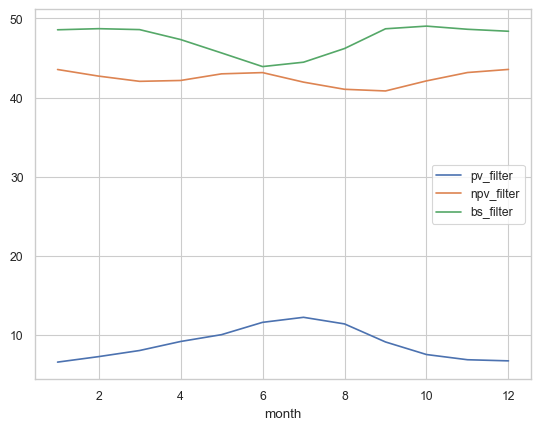

In [115]:
full_data_set[['pv_filter', 'npv_filter', 'bs_filter', 'month']].groupby('month').mean().plot()

In [116]:
ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

In [126]:
sns.color_palette("husl", 3)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.3126890019504329, 0.6928754610296064, 0.1923704830330379),
 (0.23299120924703914, 0.639586552066035, 0.9260706093977744)]

In [130]:
color_palette = [list(sns.color_palette("husl", 3))[1],
list(sns.color_palette("husl", 3))[2],
list(sns.color_palette("husl", 3))[0]]


Desert Forb
Desert Chenopod
Desert Hummock.grass
Desert Tree.Palm
Desert Shrub
Desert Tussock.grass
Temp_Med Tree.Palm
Temp_Med Shrub
Temp_Med Tussock.grass
Tropical_Savanna Tree.Palm
Tropical_Savanna Tussock.grass


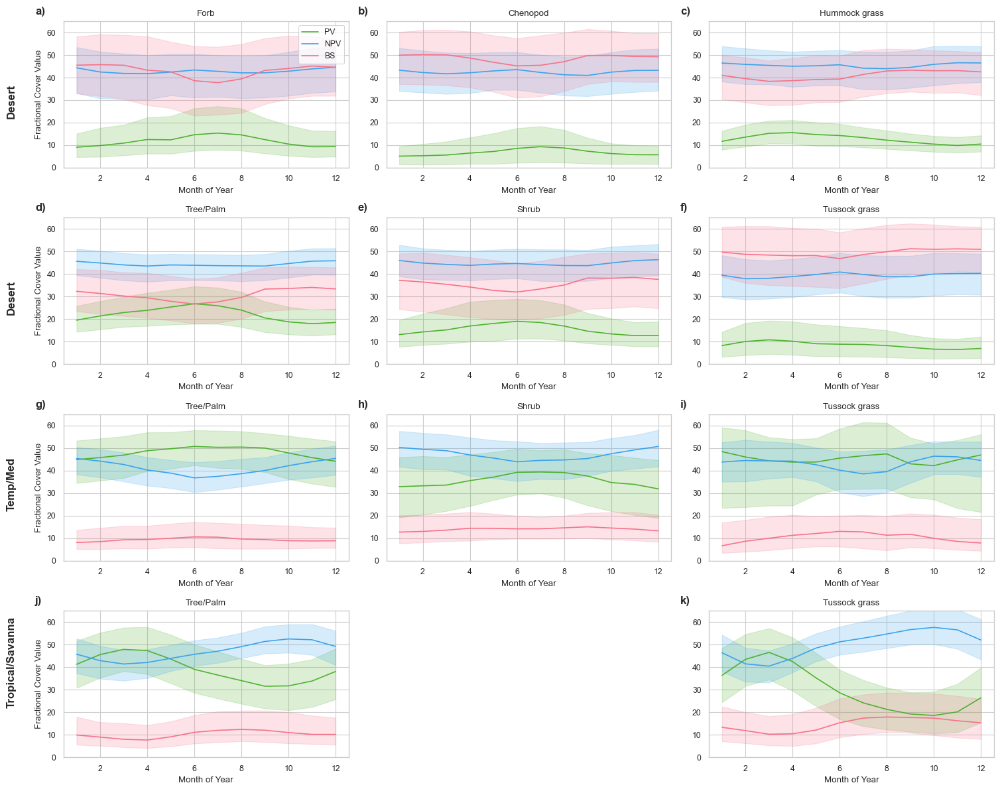

In [156]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))
labels = ['a)', 'b)', 'c)',
          'd)', 'e)', 'f)',
          'g)', 'h)', 'i)',
          'j)', 'k)', 'k)']

for i, ax in enumerate(axes.flat):
    
    # Skip at the bottom middle grid
    if i == 10:
        ax.axis('off') 
        continue
    
    if i == 11:
        chosen_group = ordered_veg_list[10] # Since there will be a skip on the 11th cell, move the 11th veg type to the 12th grid 
    else:
        chosen_group = ordered_veg_list[i]
        
    super_group_folder_name = '_'.join(chosen_group.split('/')) 
    
    print(f'{super_group_folder_name}')
    
    # Combine the training and set set 
    training = pd.read_csv(f'{results_dir}/{super_group_folder_name}/Training/{super_group_folder_name}_Training_Set.csv', parse_dates = ['time'])
    test = pd.read_csv(f'{results_dir}/{super_group_folder_name}/Training/{super_group_folder_name}_Test_Set.csv', parse_dates = ['time'])
    full_data_set = pd.concat([training, test])
    full_data_set['month'] = full_data_set['time'].dt.month
    
    # Plot the data
    full_data_set[['pv_filter', 'npv_filter', 'bs_filter', 'month']].groupby('month').median().plot(ax = ax, **{'color' : color_palette,},
                                                                                                 label = ['PV', 'NPV', 'BS'])
    
    lower = full_data_set[['pv_filter', 'npv_filter', 'bs_filter', 'month']].groupby('month').quantile(0.25)
    upper = full_data_set[['pv_filter', 'npv_filter', 'bs_filter', 'month']].groupby('month').quantile(0.75)
    
    #print(mean_set.to_numpy())
    
    ax.fill_between(mean_set.index, lower['pv_filter'], upper['pv_filter'], color=color_palette[0], alpha=0.2, label='2.5%-97.5% Quantiles')
    ax.fill_between(mean_set.index, lower['npv_filter'], upper['npv_filter'], color=color_palette[1], alpha=0.2)
    ax.fill_between(mean_set.index, lower['bs_filter'], upper['bs_filter'], color=color_palette[2], alpha=0.2)
    
    
    
    # Set ylims
    ax.set_ylim((0,65))
    
    # Annotation
    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', va='top')
    
    # Title
    veg_name = ' '.join(chosen_group.split(" ")[1].split('.'))
    if veg_name == 'Tree Palm':
        veg_name = 'Tree/Palm'
    ax.title.set_text(f'{veg_name}')
    
    # Axis lables 
    if i % 3 == 0:
        ax.set_ylabel(f'Fractional Cover Value')
        ax.text(-0.2, 0.35, chosen_group.split(" ")[0], transform=ax.transAxes, 
            fontsize=12, fontweight='bold', rotation=90)
    else:
        ax.set_ylabel(' ')
    ax.set_xlabel('Month of Year')
    
    # Remove Legend
    if i != 0:
        ax.get_legend().remove()
        
    elif i == 0:
        handles = ax.get_legend_handles_labels()[0]
        new_labels = ['PV', 'NPV', 'BS']
        ax.legend(handles, new_labels)
        
plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Seasonalities.png')

## Show a comparison between modelled pv and observed pv

# ALE Plots

In [90]:
import alibi
from alibi.explainers import ALE, plot_ale
from alibi.explainers import PartialDependence
from alibi.explainers import plot_pd
from alibi.explainers import TreePartialDependence

import numpy as np
import pandas as pd
import os 
import sys
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.metrics import root_mean_squared_error, mean_squared_error
from scipy.stats import gaussian_kde
from sklearn.ensemble import RandomForestRegressor

import seaborn as sns
sns.set()
sns.set_style("whitegrid") 
sns.set_context("paper")

from joblib import load
from pygam import LinearGAM
from matplotlib.patches import Rectangle

In [ ]:
## Output:
# ALE plots for each site group for the top 5 spatial and temporal variables 
## Inputs:
# All models utilised for each site group
# The ALE values for each site group
## Process:

# There are a few considerations however:
# 1. Not all models will show the same number of variables, or if the top 5 variables are consistent
# 2. Not all models are equally important nor good for the predictions 
# 3. Not all models will show the same relationship or partial dependence 
# What happens with case one?
# 1) Simply remove the models that don't show that variable, or
# 2) Select the most representative model
# What happens with case two?
# 1) Remove the model with a net negative feature importance 
# 2) Categorise the model by bins based on their RSME?
# In case three:
# 1) Try to group the models based on the similarity of their relationship. 

# Now given that you have all models successfully selected, preprocessed and etc.
# This might need a play around, but there are a few options:
# 1) Take an aggregate (mean, sum, median, etc) of the ALE values with an error bar.

3# Now that you selected a format:
# Have a similar grid format as you have done with the other figures
# If its not too clustered, then you can plot like you did with seasonality. 

# Then, you would have about 10 different sets of figures with the gridded format, all based on the variables you selected for 
# This would need a closer look into; perhaps make the graphs smaller? Or plot more simple data. 



In [3]:
ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

In [29]:
results_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/RESULTS/Random_Forest_Results_On_Super_Group_Results_new'
directory = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/au_dyanamic_vegetation_project/DATASETS/MODELLED_TRAINING_DATA'
plots_dir = 'C:/Users/krish/Desktop/DYNAMIC MODEL VEGETATION PROJECT/Thesis/Plots_For_Thesis/Chapter 3'

In [4]:
targeted_group = ['Tropical/Savanna Tussock.grass']
features_included = dict()
max_counter = 10
for counter, s in enumerate(targeted_group):
    
    print(f'Obtaining results from {s} sites ({counter + 1}/{max_counter})')
    super_group_folder_name = '_'.join(s.split('/')) 
    directory_val = f'{directory}/{super_group_folder_name}/Validation' 
    number_of_folds = len(os.listdir(directory_val)) # note; this assumes that each folder in this directory is a K-Fold
    
    training_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Training/{super_group_folder_name}_Train_Set.csv', 
                               index_col = ['time'], parse_dates = ['time']).copy()
    test_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Test/{super_group_folder_name}_Test_Set.csv',
                               index_col = ['time'], parse_dates = ['time']).copy()
    
    for i in range(number_of_folds):
        folder_num = i+1
        
        print(f'Load the random forest ({folder_num}/{number_of_folds})')
        rf_model = load(f'{results_dir}/{super_group_folder_name}/Results/KFold_{folder_num}/Random_Forest.joblib')
        break
    

Obtaining results from Tropical/Savanna Tussock.grass sites (1/10)
Load the random forest (1/10)


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

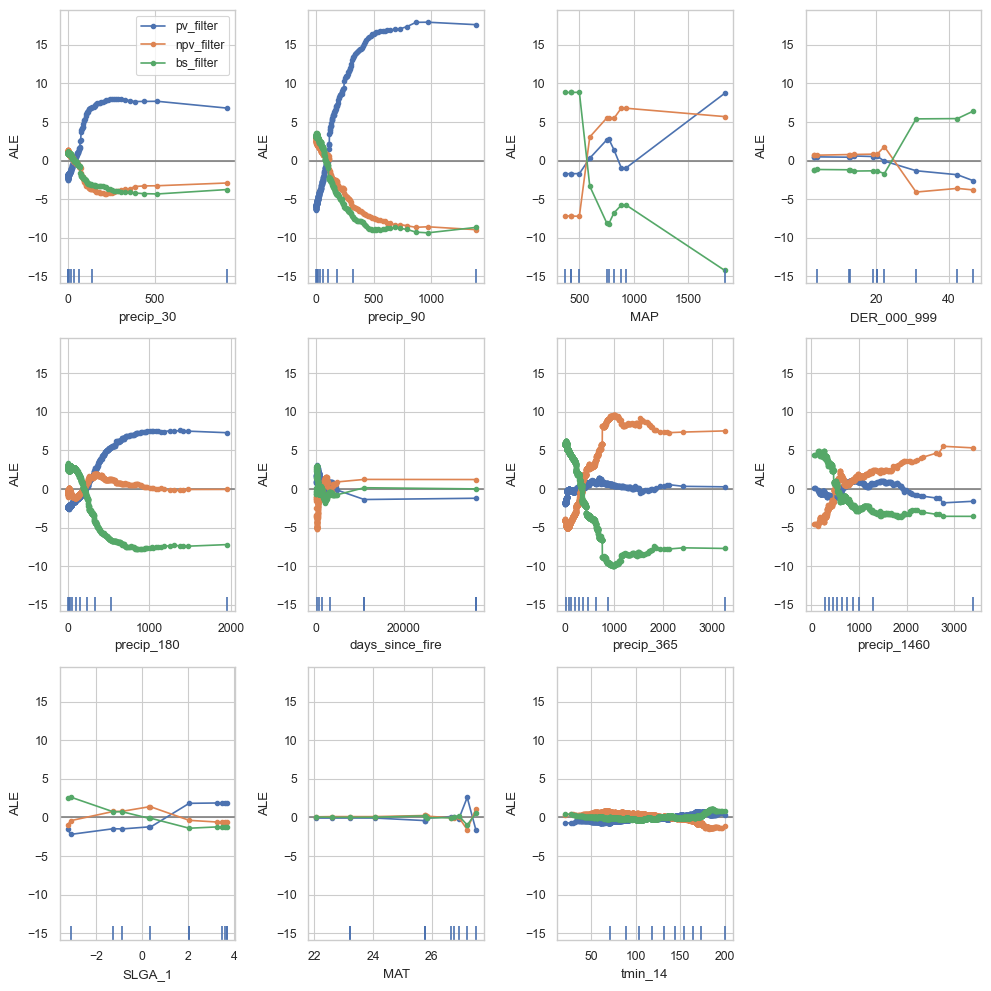

In [24]:
TARGET = ['pv_filter', 'npv_filter', 'bs_filter']
features_in = rf_model.feature_names_in_
rf_ale = ALE(rf_model.predict, feature_names= features_in, target_names=TARGET)
rf_exp = rf_ale.explain(np.array(test_set[features_in]))
plot_ale(rf_exp, n_cols=4, fig_kw={'figwidth':10, 'figheight': 10});

In [ ]:
# Now repeat with 5 models 

In [47]:
targeted_group = ['Tropical/Savanna Tussock.grass']
TARGET = ['pv_filter', 'npv_filter', 'bs_filter']
features_included = dict()
max_counter = 10
for counter, s in enumerate(targeted_group):
    
    print(f'Obtaining results from {s} sites ({counter + 1}/{max_counter})')
    super_group_folder_name = '_'.join(s.split('/')) 
    directory_val = f'{directory}/{super_group_folder_name}/Validation' 
    number_of_folds = len(os.listdir(directory_val)) # note; this assumes that each folder in this directory is a K-Fold
    
    training_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Training/{super_group_folder_name}_Train_Set.csv', 
                               index_col = ['time'], parse_dates = ['time']).copy()
    test_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Test/{super_group_folder_name}_Test_Set.csv',
                               index_col = ['time'], parse_dates = ['time']).copy()
    
    for i in range(number_of_folds):
        folder_num = i+1
        
        print(f'Load the random forest ({folder_num}/{number_of_folds})')
        rf_model = load(f'{results_dir}/{super_group_folder_name}/Results/KFold_{folder_num}/Random_Forest.joblib')
        
        features_in = rf_model.feature_names_in_
        rf_ale = ALE(rf_model.predict, feature_names= features_in, target_names=TARGET)
        rf_exp = rf_ale.explain(np.array(test_set[features_in]))
        print(rf_exp)
        #plot_ale(rf_exp, n_cols=4, fig_kw={'figwidth':10, 'figheight': 10});
        #plt.show()
        break

Obtaining results from Tropical/Savanna Tussock.grass sites (1/10)
Load the random forest (1/10)


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Explanation(meta={
  'name': 'ALE',
  'type': ['blackbox'],
  'explanations': ['global'],
  'params': {
              'check_feature_resolution': True,
              'low_resolution_threshold': 10,
              'extrapolate_constant': True,
              'extrapolate_constant_perc': 10.0,
              'extrapolate_constant_min': 0.1,
              'min_bin_points': 4}
            ,
  'version': '0.9.6'}
, data={
  'ale_values': [array([[-1.85639576e+00,  1.07922623e+00,  7.82201567e-01],
       [-1.85540059e+00,  1.09778106e+00,  7.64250882e-01],
       [-1.85050145e+00,  1.07384245e+00,  7.83204730e-01],
       [-1.83213440e+00,  1.06487434e+00,  7.73909825e-01],
       [-1.82403084e+00,  1.07726831e+00,  7.53253327e-01],
       [-1.81635214e+00,  1.07380638e+00,  7.49213429e-01],
       [-1.81823048e+00,  1.06723844e+00,  7.57732591e-01],
       [-1.81624537e+00,  1.06350097e+00,  7.59730270e-01],
       [-1.80958304e+00,  1.06381726e+00,  7.52716709e-01],
       [-1.81754007e+00, 

C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


## Now A program that will generate the datafile files per vegetation group

In [139]:
targeted_group = ordered_veg_list
TARGET = ['pv_filter', 'npv_filter', 'bs_filter']
features_included = dict()
max_counter = 10

for counter, s in enumerate(targeted_group):
    
    print(f'Obtaining results from {s} sites ({counter + 1}/{max_counter})')
    
    super_group_folder_name = '_'.join(s.split('/')) 
    directory_val = f'{directory}/{super_group_folder_name}/Validation' 
    number_of_folds = len(os.listdir(directory_val)) # note; this assumes that each folder in this directory is a K-Fold
    
    training_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Training/{super_group_folder_name}_Train_Set.csv', 
                               index_col = ['time'], parse_dates = ['time']).copy()
    test_set = pd.read_csv(f'{directory}/{super_group_folder_name}/Test/{super_group_folder_name}_Test_Set.csv',
                           index_col = ['time'], parse_dates = ['time']).copy()
    
    ALE_all_models = []
    
    for i in range(number_of_folds):
            
        folder_num = i+1
        print(f'Load the random forest ({folder_num}/{number_of_folds})')
        
        rf_model = load(f'{results_dir}/{super_group_folder_name}/Results/KFold_{folder_num}/Random_Forest.joblib')
        
        features_in = rf_model.feature_names_in_
        print(features_in)
        
        rf_ale = ALE(rf_model.predict, feature_names= features_in, target_names=TARGET)
        rf_exp = rf_ale.explain(np.array(test_set[features_in]))

        features_in_list = list(features_in)
        to_index = []
        for feat in features_in_list:
            d = feat + '_feat_values'
            to_index.append(feat)
            to_index.append(d)

        ALE_data_frames_list = []

        for target_index in range(3):
            ALE_values_column = [] 
            for feat in features_in_list:
                ale_values = rf_exp['data']['ale_values'][features_in_list.index(feat)][:,target_index]
                ale_feature_values = rf_exp['data']['feature_values'][features_in_list.index(feat)]
                ALE_values_column.append(ale_values)
                ALE_values_column.append(ale_feature_values)

            temp_df = pd.DataFrame(ALE_values_column, index = to_index).T
            temp_df['Target'] = TARGET[target_index]
            ALE_data_frames_list.append(temp_df)

        ALE_data_frame = pd.concat(ALE_data_frames_list)
        ALE_data_frame['Model'] = folder_num
        
        ALE_all_models.append(ALE_data_frame)
    ALE_all_models_df = pd.concat(ALE_all_models)
    ALE_all_models_df.to_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')

Obtaining results from Desert Forb sites (1/10)
Load the random forest (1/10)
['MAP' 'CO2' 'MAT' 'precip_90' 'tmax_14' 'days_since_fire' 'precip_365'
 'SLGA_3' 'aspect_1s' 'tmax_lag' 'precip_180' 'precip_30'
 'photoperiod_gradient' 'SLGA_1']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'CO2' 'MAT' 'VPD_30' 'DER_000_999' 'precip_90' 'precip_180'
 'aspect_1s' 'precip_365' 'precip_30' 'VPD_7' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'CO2' 'SLGA_1' 'VPD_30' 'precip_90' 'MAT' 'photoperiod_gradient'
 'days_since_fire']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['MAP' 'CO2' 'MAT' 'VPD_14' 'precip_365' 'SLGA_3' 'days_since_fire'
 'SLGA_1' 'VPD_7' 'SLGA_2' 'tmax_7' 'VPD_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'CO2' 'MAT' 'VPD_30' 'days_since_fire' 'VPD_14' 'tmin_30'
 'precip_1460' 'tmax_14' 'VPD_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['VPD_30' 'CO2' 'DER_000_999' 'SLGA_2' 'precip_1095' 'precip_730'
 'precip_365' 'tmax_14' 'tmin_7' 'precip_90' 'precip_180' 'precip_1460'
 'photoperiod' 'photoperiod_gradient' 'tmin_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['precip_730' 'VPD_30' 'tmin_30' 'precip_90' 'VPD_7' 'precip_30' 'tmax_30'
 'tmin_7' 'tmax_7' 'VPD_14' 'tmax_lag' 'tmin_lag' 'CO2' 'precip_365'
 'precip_1095' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['precip_90' 'precip_180' 'MAT' 'precip_365' 'VPD_14' 'MAP' 'VPD_7'
 'photoperiod' 'VPD_30' 'photoperiod_gradient']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'VPD_30' 'CO2' 'SLGA_1' 'precip_90' 'twi_1s' 'precip_30'
 'precip_180' 'days_since_fire' 'photoperiod' 'precip_1095' 'precip_365'
 'precip_730' 'VPD_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['precip_365' 'MAP' 'aspect_1s' 'twi_1s' 'tmax_lag' 'precip_730'
 'precip_90' 'precip_180' 'precip_30' 'tmin_7' 'precip_1095' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Desert Chenopod sites (2/10)
Load the random forest (1/10)
['MAP' 'CO2' 'SLGA_3' 'aspect_1s' 'VPD_30' 'DER_000_999' 'precip_365'
 'precip_90' 'VPD_7' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'VPD_30' 'SLGA_3' 'aspect_1s' 'tmax_30' 'VPD_14' 'VPD_lag'
 'fire_severity' 'tmax_14' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'CO2' 'SLGA_2' 'MAT' 'aspect_1s' 'VPD_30' 'photoperiod' 'precip_90'
 'precip_365' 'precip_180' 'tmin_7' 'VPD_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['VPD_30' 'CO2' 'SLGA_3' 'twi_1s' 'DER_000_999' 'VPD_14' 'precip_90'
 'tmin_lag' 'tmin_7' 'precip_180' 'VPD_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'CO2' 'SLGA_3' 'days_since_fire']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'CO2' 'SLGA_3' 'SLGA_2' 'VPD_7' 'precip_90' 'VPD_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['CO2' 'SLGA_2' 'SLGA_3' 'MAT' 'tmin_14' 'precip_365' 'precip_90'
 'precip_180' 'precip_30' 'precip_730']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['SLGA_3' 'DER_000_999' 'twi_1s' 'MAP' 'SLGA_1' 'aspect_1s']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'CO2' 'aspect_1s' 'MAT' 'SLGA_3' 'photoperiod' 'tmax_30'
 'precip_30' 'precip_730' 'precip_365' 'precip_90' 'tmin_30' 'VPD_30'
 'photoperiod_gradient']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['CO2' 'MAT' 'SLGA_3' 'twi_1s' 'aspect_1s' 'days_since_fire'
 'fire_severity' 'photoperiod' 'precip_180' 'precip_1095' 'precip_30'
 'precip_365' 'precip_1460' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Desert Hummock.grass sites (3/10)
Load the random forest (1/10)
['MAP' 'days_since_fire' 'DER_000_999' 'precip_90' 'precip_365' 'VPD_7'
 'SLGA_3' 'photoperiod_gradient' 'VPD_14' 'SLGA_2' 'CO2' 'precip_1460'
 'VPD_lag' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['days_since_fire' 'SLGA_3' 'DER_000_999' 'twi_1s' 'MAT' 'CO2'
 'precip_730' 'precip_90' 'precip_365' 'precip_180' 'tmin_14' 'VPD_lag'
 'photoperiod_gradient']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['fire_severity' 'CO2' 'MAT' 'SLGA_3' 'twi_1s' 'tmax_14' 'precip_365'
 'precip_180' 'VPD_7' 'VPD_lag' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['CO2' 'SLGA_2' 'DER_000_999' 'twi_1s' 'VPD_7' 'precip_30' 'tmax_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'days_since_fire' 'MAT' 'precip_90' 'precip_365' 'DER_000_999'
 'CO2' 'precip_30' 'precip_180' 'SLGA_2' 'precip_1460' 'SLGA_1'
 'aspect_1s' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'MAT' 'DER_000_999']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\AppData\Local\Temp\ipykernel_10544\1652073357.py:46: DeprecationWarning: The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.
  ale_values = rf_exp['data']['ale_values'][features_in_list.index(feat)][:,target_index]
C:\Users\krish\AppData\Local\Temp\ipykernel_10544\1652073357.py:47: DeprecationWarning: The Explanation object is not a dictionary anymore and accessing elements should be done via attribute access. Accessing via item will stop working in a future version.
  ale_feature_values = rf_exp['data']['feature_values'][features_in_list.index(feat)]
C:\Users\krish\AppData\Local\Temp\ipykernel_10544\1652073357.py:46: DeprecationWarning: The Explanation object is not a dic

Load the random forest (7/10)
['MAP' 'days_since_fire' 'DER_000_999' 'MAT' 'CO2' 'SLGA_3'
 'photoperiod_gradient' 'tmax_14' 'fire_severity' 'precip_90' 'precip_30'
 'precip_730']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['days_since_fire' 'CO2' 'DER_000_999' 'SLGA_3' 'MAT' 'precip_90' 'twi_1s'
 'photoperiod' 'tmin_30' 'tmax_14' 'precip_180' 'tmin_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['CO2' 'MAT' 'SLGA_1' 'SLGA_2' 'days_since_fire' 'MAP' 'VPD_14'
 'precip_365' 'VPD_lag' 'tmin_7' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['precip_90' 'MAT' 'aspect_1s' 'MAP' 'tmin_30' 'precip_180' 'precip_365'
 'precip_1095' 'VPD_30' 'VPD_lag' 'SLGA_1' 'tmax_14' 'tmin_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Desert Tree.Palm sites (4/10)
Load the random forest (1/10)
['MAP' 'CO2' 'MAT' 'SLGA_1' 'days_since_fire' 'photoperiod_gradient'
 'tmin_30' 'twi_1s' 'photoperiod' 'SLGA_3' 'precip_365' 'precip_90'
 'tmax_30' 'VPD_7' 'precip_180' 'VPD_30' 'precip_730']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'MAT' 'SLGA_2' 'aspect_1s' 'fire_severity']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'CO2' 'DER_000_999' 'precip_90' 'tmax_7' 'precip_30' 'SLGA_1'
 'SLGA_2' 'MAT' 'photoperiod' 'precip_1095' 'VPD_30' 'precip_180' 'VPD_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['precip_90' 'MAP' 'SLGA_3' 'MAT' 'VPD_14' 'tmax_7' 'fire_severity'
 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['CO2' 'MAT' 'twi_1s' 'MAP' 'SLGA_1' 'VPD_7' 'DER_000_999' 'precip_90'
 'precip_365' 'precip_730' 'VPD_30' 'fire_severity']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'MAT' 'SLGA_1' 'twi_1s' 'photoperiod' 'CO2' 'SLGA_2' 'aspect_1s'
 'precip_90' 'precip_730']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['MAP' 'MAT' 'SLGA_2' 'SLGA_1' 'VPD_30' 'precip_30' 'photoperiod_gradient'
 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['MAP' 'CO2' 'MAT' 'days_since_fire' 'VPD_14' 'SLGA_3' 'photoperiod'
 'aspect_1s' 'fire_severity' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'CO2' 'DER_000_999' 'aspect_1s' 'VPD_30' 'photoperiod_gradient'
 'precip_90' 'precip_365' 'precip_730' 'tmin_14' 'precip_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['VPD_14' 'SLGA_2' 'twi_1s' 'MAP' 'precip_90' 'photoperiod' 'tmin_lag'
 'precip_365' 'precip_730' 'precip_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Desert Shrub sites (5/10)
Load the random forest (1/10)
['MAP' 'MAT' 'SLGA_1' 'SLGA_3' 'fire_severity' 'days_since_fire'
 'photoperiod_gradient' 'precip_1095' 'precip_90' 'tmin_30' 'precip_365'
 'tmax_7' 'precip_730' 'tmax_14' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'SLGA_1' 'SLGA_3' 'MAT' 'fire_severity' 'days_since_fire'
 'precip_90' 'photoperiod' 'photoperiod_gradient' 'precip_30' 'VPD_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'days_since_fire' 'MAT' 'SLGA_3' 'SLGA_1' 'VPD_14' 'CO2' 'VPD_lag'
 'precip_90' 'VPD_7' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['MAP' 'MAT' 'SLGA_1' 'CO2' 'days_since_fire' 'fire_severity' 'tmin_7'
 'precip_90' 'precip_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'MAT' 'SLGA_1' 'SLGA_2' 'fire_severity' 'DER_000_999' 'twi_1s'
 'VPD_lag' 'photoperiod_gradient' 'tmax_lag' 'VPD_30' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'MAT' 'DER_000_999' 'SLGA_2' 'precip_90' 'aspect_1s' 'VPD_30'
 'fire_severity' 'VPD_lag' 'VPD_7' 'precip_365' 'precip_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['MAP' 'CO2' 'MAT' 'VPD_14' 'precip_90' 'days_since_fire'
 'photoperiod_gradient' 'precip_180' 'precip_1460' 'precip_30'
 'photoperiod' 'tmax_7' 'fire_severity']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['MAP' 'MAT' 'SLGA_2']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'days_since_fire' 'SLGA_1' 'SLGA_3' 'aspect_1s' 'CO2' 'photoperiod'
 'tmin_30' 'precip_180' 'precip_365' 'photoperiod_gradient' 'tmax_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['MAP' 'CO2' 'MAT' 'SLGA_2' 'SLGA_3' 'days_since_fire' 'DER_000_999'
 'precip_90' 'photoperiod' 'precip_180' 'precip_365' 'twi_1s']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Desert Tussock.grass sites (6/10)
Load the random forest (1/10)
['CO2' 'SLGA_1' 'aspect_1s' 'MAT' 'VPD_30' 'MAP' 'SLGA_2'
 'photoperiod_gradient' 'precip_365' 'photoperiod' 'VPD_7' 'tmin_7'
 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['CO2' 'MAT' 'SLGA_2' 'MAP' 'photoperiod_gradient' 'VPD_30' 'SLGA_1'
 'tmin_14' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'CO2' 'SLGA_1' 'SLGA_3' 'precip_30' 'photoperiod' 'SLGA_2'
 'precip_180' 'VPD_lag' 'precip_1095' 'precip_1460' 'photoperiod_gradient'
 'tmax_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['CO2' 'SLGA_1' 'aspect_1s' 'DER_000_999' 'days_since_fire' 'precip_365'
 'VPD_7' 'SLGA_3' 'SLGA_2' 'photoperiod_gradient' 'tmin_30' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['precip_90' 'precip_365' 'SLGA_1' 'SLGA_2' 'precip_30' 'MAT' 'VPD_30'
 'photoperiod' 'tmin_lag' 'DER_000_999']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['precip_90' 'precip_365' 'SLGA_1' 'precip_730' 'precip_180' 'DER_000_999'
 'MAP' 'VPD_30' 'MAT' 'SLGA_3' 'SLGA_2' 'precip_30' 'precip_1095'
 'precip_1460' 'photoperiod_gradient' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['precip_90' 'precip_730' 'SLGA_1' 'precip_30' 'DER_000_999' 'VPD_30'
 'CO2' 'photoperiod' 'precip_1095' 'VPD_7' 'tmin_30' 'VPD_lag' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['precip_90' 'CO2' 'SLGA_1' 'SLGA_2' 'precip_180' 'precip_30' 'tmin_30'
 'precip_1460' 'photoperiod_gradient' 'tmin_14' 'photoperiod']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['CO2' 'MAT' 'SLGA_1' 'twi_1s' 'SLGA_3' 'photoperiod_gradient' 'tmin_14'
 'VPD_lag' 'precip_30' 'aspect_1s' 'MAP' 'precip_365' 'tmin_30' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['CO2' 'SLGA_1' 'SLGA_2' 'precip_365' 'photoperiod' 'photoperiod_gradient'
 'tmin_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Temp/Med Tree.Palm sites (7/10)
Load the random forest (1/10)
['photoperiod' 'MAP' 'days_since_fire' 'SLGA_2' 'tmax_lag' 'precip_730'
 'DER_000_999' 'precip_365' 'tmax_30' 'tmin_30' 'precip_1095' 'precip_180']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'MAT' 'aspect_1s' 'fire_severity' 'SLGA_2' 'DER_000_999']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'days_since_fire' 'MAT' 'aspect_1s' 'photoperiod' 'tmax_30'
 'precip_180' 'precip_90' 'VPD_lag' 'tmin_30' 'VPD_7' 'VPD_14' 'tmin_lag'
 'VPD_30' 'tmin_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['MAP' 'days_since_fire' 'CO2' 'SLGA_3' 'fire_severity' 'precip_1460'
 'tmax_lag' 'precip_180' 'photoperiod_gradient' 'tmax_30' 'tmin_14'
 'precip_30' 'tmin_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['precip_90' 'MAP' 'MAT' 'fire_severity' 'photoperiod_gradient' 'SLGA_2'
 'tmin_30' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'days_since_fire' 'fire_severity' 'twi_1s' 'SLGA_1' 'VPD_7'
 'precip_90' 'photoperiod_gradient' 'precip_365' 'precip_180' 'tmax_30'
 'precip_30' 'SLGA_3' 'photoperiod' 'VPD_lag' 'tmin_7' 'precip_1095']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['photoperiod' 'MAP' 'MAT' 'days_since_fire' 'SLGA_1' 'precip_1095'
 'tmax_7' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['MAP' 'fire_severity' 'twi_1s']
Load the random forest (9/10)


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

['MAP' 'days_since_fire' 'twi_1s' 'SLGA_1' 'VPD_14' 'precip_90'
 'fire_severity' 'photoperiod_gradient' 'tmin_30' 'precip_180' 'tmax_lag'
 'tmax_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['MAP' 'days_since_fire' 'MAT' 'VPD_14' 'CO2' 'photoperiod_gradient'
 'SLGA_2' 'SLGA_3' 'precip_365' 'precip_90' 'tmin_30' 'photoperiod']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Temp/Med Shrub sites (8/10)
Load the random forest (1/10)
['MAP' 'SLGA_2' 'SLGA_3' 'SLGA_1' 'VPD_30' 'precip_365' 'fire_severity'
 'photoperiod_gradient' 'VPD_14' 'MAT']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'MAT' 'SLGA_2' 'fire_severity' 'DER_000_999' 'photoperiod'
 'VPD_lag' 'SLGA_1' 'VPD_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'days_since_fire' 'DER_000_999' 'SLGA_1' 'fire_severity' 'twi_1s'
 'tmax_7' 'CO2' 'tmax_30' 'photoperiod_gradient' 'VPD_7' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['precip_1460' 'MAP' 'SLGA_1' 'days_since_fire' 'photoperiod'
 'precip_1095' 'DER_000_999' 'tmax_14' 'precip_90']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'days_since_fire' 'SLGA_1' 'photoperiod' 'precip_180' 'SLGA_2'
 'tmax_30' 'precip_365' 'tmax_7' 'tmin_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['photoperiod' 'MAP' 'days_since_fire' 'fire_severity' 'CO2' 'precip_90'
 'precip_730' 'precip_365' 'photoperiod_gradient' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['MAP' 'SLGA_1' 'DER_000_999' 'days_since_fire' 'tmax_7' 'CO2'
 'fire_severity' 'twi_1s' 'photoperiod' 'photoperiod_gradient'
 'precip_1460']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['fire_severity' 'SLGA_1' 'DER_000_999' 'MAT' 'aspect_1s' 'SLGA_3'
 'tmin_30' 'photoperiod' 'precip_180' 'precip_30' 'precip_90']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'SLGA_1' 'SLGA_2' 'fire_severity' 'days_since_fire' 'tmax_lag'
 'precip_180' 'CO2' 'precip_1460' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['fire_severity' 'SLGA_1' 'SLGA_2' 'aspect_1s' 'CO2' 'tmax_lag'
 'precip_365' 'tmax_30' 'precip_30' 'tmin_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Temp/Med Tussock.grass sites (9/10)
Load the random forest (1/10)
['MAP' 'VPD_30' 'CO2' 'SLGA_2' 'photoperiod' 'fire_severity' 'DER_000_999'
 'precip_30' 'VPD_lag' 'days_since_fire']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['MAP' 'days_since_fire' 'SLGA_2' 'VPD_14' 'precip_365' 'fire_severity'
 'photoperiod_gradient' 'tmax_30' 'CO2' 'VPD_7' 'tmax_lag' 'tmin_14'
 'precip_180']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['MAP' 'days_since_fire' 'tmax_7' 'photoperiod_gradient' 'CO2' 'SLGA_2'
 'SLGA_1' 'tmax_lag' 'precip_90' 'tmin_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['MAP' 'VPD_30' 'SLGA_2' 'tmin_30' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['MAP' 'days_since_fire' 'SLGA_2' 'CO2' 'tmin_7' 'twi_1s' 'VPD_14'
 'aspect_1s' 'SLGA_3' 'tmin_30' 'precip_90' 'photoperiod_gradient'
 'fire_severity']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['MAP' 'VPD_30' 'SLGA_2' 'CO2' 'SLGA_1' 'VPD_lag' 'precip_1460']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['MAP' 'CO2' 'tmax_30' 'photoperiod' 'precip_365' 'fire_severity'
 'precip_30' 'precip_90' 'precip_1460' 'precip_730' 'tmax_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['MAP' 'VPD_30' 'tmin_30' 'days_since_fire' 'CO2' 'precip_365' 'precip_30'
 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['MAP' 'MAT' 'SLGA_1' 'days_since_fire' 'DER_000_999' 'CO2' 'precip_90'
 'tmin_7' 'precip_30' 'tmin_lag' 'fire_severity']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['photoperiod' 'CO2' 'tmin_30' 'SLGA_3' 'MAT' 'twi_1s' 'fire_severity'
 'VPD_14' 'DER_000_999']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Tropical/Savanna Tree.Palm sites (10/10)
Load the random forest (1/10)
['precip_90' 'MAP' 'SLGA_3' 'SLGA_1' 'VPD_lag' 'twi_1s' 'VPD_7' 'MAT'
 'photoperiod_gradient' 'CO2' 'fire_severity' 'days_since_fire']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['precip_90' 'MAP' 'days_since_fire' 'SLGA_3' 'precip_30' 'VPD_lag' 'CO2'
 'twi_1s' 'tmin_7' 'precip_365' 'precip_180']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['photoperiod' 'precip_90' 'MAP' 'days_since_fire' 'CO2'
 'photoperiod_gradient' 'fire_severity' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['precip_90' 'MAP' 'CO2' 'tmin_lag' 'days_since_fire' 'precip_180'
 'tmin_30' 'precip_1460' 'precip_1095' 'precip_30' 'photoperiod' 'tmax_7'
 'fire_severity' 'tmax_30' 'precip_730']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['precip_90' 'MAP' 'SLGA_3' 'precip_30' 'tmax_14' 'photoperiod_gradient'
 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['precip_90' 'MAP' 'SLGA_3' 'photoperiod_gradient' 'VPD_14'
 'days_since_fire' 'precip_180' 'precip_30' 'precip_730' 'SLGA_1'
 'DER_000_999' 'tmin_14' 'VPD_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['precip_90' 'MAP' 'CO2' 'twi_1s' 'VPD_lag' 'SLGA_2']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['precip_90' 'MAP' 'SLGA_3' 'photoperiod' 'VPD_30' 'aspect_1s' 'tmin_7'
 'CO2' 'photoperiod_gradient' 'tmax_14' 'precip_1460' 'VPD_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['precip_90' 'MAP' 'SLGA_1' 'VPD_30' 'photoperiod_gradient' 'MAT' 'SLGA_2'
 'precip_365' 'tmax_7' 'precip_180' 'precip_30' 'tmax_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['precip_90' 'MAP' 'twi_1s' 'SLGA_3' 'precip_30' 'VPD_14' 'precip_180'
 'aspect_1s']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Obtaining results from Tropical/Savanna Tussock.grass sites (11/10)
Load the random forest (1/10)
['precip_30' 'precip_90' 'MAP' 'MAT' 'SLGA_3' 'precip_180' 'CO2'
 'days_since_fire' 'precip_365' 'VPD_14' 'tmin_7' 'precip_730' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (2/10)
['precip_90' 'MAP' 'CO2' 'MAT' 'precip_30' 'SLGA_1' 'precip_365'
 'precip_180' 'precip_730' 'VPD_14' 'days_since_fire' 'photoperiod'
 'DER_000_999' 'VPD_30']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (3/10)
['precip_30' 'precip_90' 'aspect_1s' 'MAP' 'SLGA_1' 'CO2' 'MAT'
 'precip_730' 'precip_180' 'twi_1s' 'fire_severity' 'precip_365'
 'precip_1460' 'tmax_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (4/10)
['precip_90' 'MAP' 'CO2' 'days_since_fire' 'DER_000_999'
 'photoperiod_gradient' 'precip_365' 'precip_730' 'tmax_7' 'tmax_14'
 'precip_180' 'precip_1460' 'tmax_lag' 'fire_severity' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (5/10)
['precip_30' 'precip_90' 'MAP' 'days_since_fire' 'precip_180' 'CO2'
 'precip_365' 'VPD_7' 'precip_1460' 'VPD_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (6/10)
['precip_30' 'precip_90' 'MAP' 'DER_000_999' 'precip_180'
 'days_since_fire' 'precip_365' 'precip_1460' 'SLGA_1' 'MAT' 'tmin_14']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (7/10)
['precip_90' 'MAP' 'CO2' 'twi_1s' 'photoperiod' 'photoperiod_gradient'
 'precip_180' 'VPD_30' 'tmin_30' 'aspect_1s' 'precip_30' 'VPD_7'
 'tmax_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (8/10)
['precip_90' 'MAP' 'SLGA_2' 'photoperiod_gradient' 'tmax_7' 'DER_000_999'
 'precip_365' 'CO2' 'precip_180' 'fire_severity' 'MAT']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (9/10)
['precip_90' 'MAP' 'twi_1s' 'precip_30' 'SLGA_3' 'CO2' 'aspect_1s'
 'precip_180' 'precip_730' 'VPD_lag' 'MAT' 'SLGA_2' 'tmax_14'
 'photoperiod' 'precip_1460' 'tmax_7' 'photoperiod_gradient' 'tmin_lag']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

Load the random forest (10/10)
['precip_90' 'MAP' 'CO2' 'SLGA_1' 'aspect_1s' 'MAT' 'tmin_14' 'precip_365'
 'SLGA_2' 'VPD_14' 'fire_severity' 'tmax_30' 'VPD_7' 'tmin_7' 'VPD_lag'
 'tmin_lag' 'tmax_7']


C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\krish\anaconda3\Lib\site-packages\sklearn\base.py:493: U

In [9]:
ALE_all_models_df.to_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')

In [10]:
ALE_all_models_df[to_index[1::2]].describe()

,precip_90_feat_values,MAP_feat_values,CO2_feat_values,SLGA_1_feat_values,aspect_1s_feat_values,MAT_feat_values,tmin_14_feat_values,precip_365_feat_values,SLGA_2_feat_values,VPD_14_feat_values,fire_severity_feat_values,tmax_30_feat_values,VPD_7_feat_values,tmin_7_feat_values,VPD_lag_feat_values,tmin_lag_feat_values,tmax_7_feat_values
count,9030.000000,330.000000,972.000000,132.000000,132.000000,252.000000,14670.000000,31320.000000,99.000000,22224.000000,372.000000,5460.000000,17163.000000,9942.000000,11316.000000,12069.000000,19680.000000
mean,116.876133,753.347689,379.062778,0.761336,134.363262,25.365358,126.525762,381.507091,-0.260411,13.984058,11.626371,512.630895,12.156393,108.381102,2.079604,17.986284,193.478302
std,179.985144,390.329257,20.377690,2.537708,71.433108,1.809701,38.394638,373.421332,2.830732,5.949008,9.520151,71.008853,5.153062,32.986627,0.921482,5.878379,27.959559
min,0.000000,368.135561,348.250000,-3.234009,44.349480,22.078380,20.624023,0.000977,-5.783931,0.652479,0.000000,272.874023,0.791777,16.232422,-0.457248,0.545898,98.880859
25%,6.992188,423.096566,360.970000,-1.246487,62.898520,23.848946,96.715500,100.834473,-1.480757,9.549413,4.093093,458.880617,8.342036,83.488281,1.395661,13.701416,172.905865
50%,42.567949,752.711869,377.390000,0.363603,154.729280,25.813554,131.613425,278.863281,0.309826,13.174654,8.838100,513.205263,11.442572,112.747070,1.943259,18.687988,193.889582
75%,149.878231,885.859148,395.395000,3.494847,194.156270,26.791444,160.041415,551.498535,2.285626,17.577872,18.218707,566.954123,15.288731,136.529541,2.623678,22.880615,214.575577
max,1387.742188,1830.784498,416.490000,3.711477,252.389200,27.496116,199.891602,3257.262695,3.391604,36.854396,39.643692,697.014648,31.530692,177.086914,5.765511,31.655273,268.600586


In [11]:
ALE_all_models_df

,precip_30,precip_30_feat_values,precip_90,precip_90_feat_values,MAP,MAP_feat_values,MAT,MAT_feat_values,SLGA_3,SLGA_3_feat_values,...,VPD_7,VPD_7_feat_values,tmin_30,tmin_30_feat_values,SLGA_2,SLGA_2_feat_values,VPD_lag,VPD_lag_feat_values,tmax_30,tmax_30_feat_values
0,-1.856396,0.000000,-4.521330,0.000000,-6.915910,368.135561,0.901431,22.078380,-0.880219,-2.315742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.855401,0.000977,-4.502335,0.000977,-6.915910,419.166424,0.721308,22.614348,-0.889094,-2.201633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-1.850501,0.001953,-4.502044,0.001953,-6.915910,423.096566,0.706308,23.217902,-0.948850,-2.094034,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-1.832134,0.002930,-4.528017,0.002930,-1.818404,499.639830,0.613843,24.059294,-1.246380,-1.977645,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-1.824031,0.003906,-4.516754,0.004883,2.762928,595.006223,0.414749,25.772006,-1.269933,-1.929507,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.902152,28.676717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1903,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.902152,29.076826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.895695,29.624614,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.895695,30.258496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: xlabel='photoperiod_gradient_feat_values'>

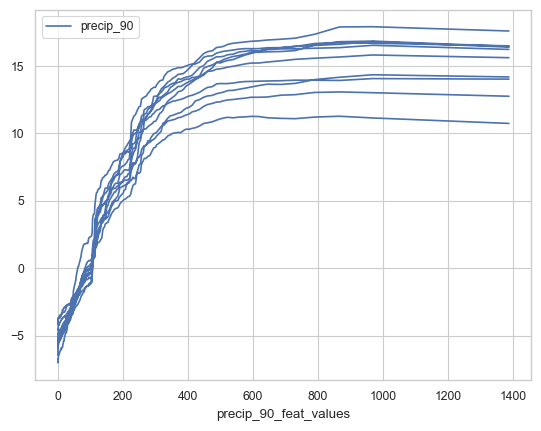

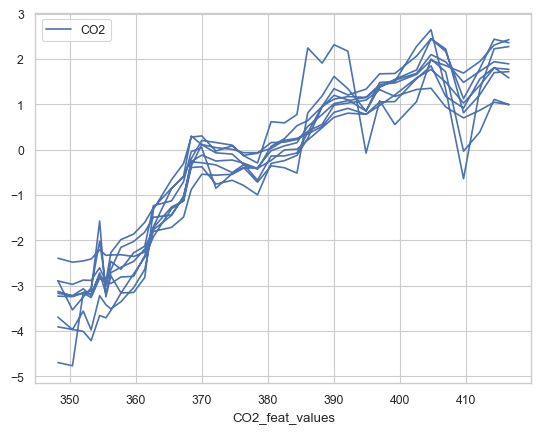

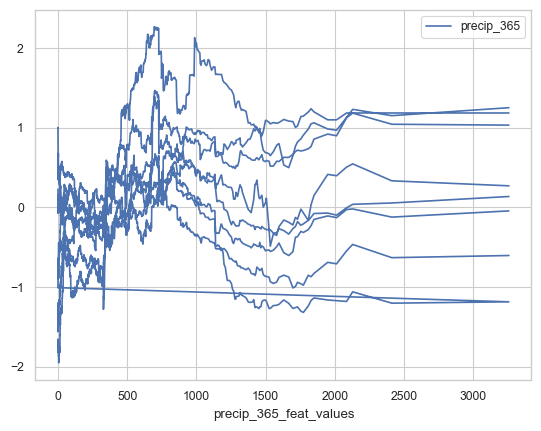

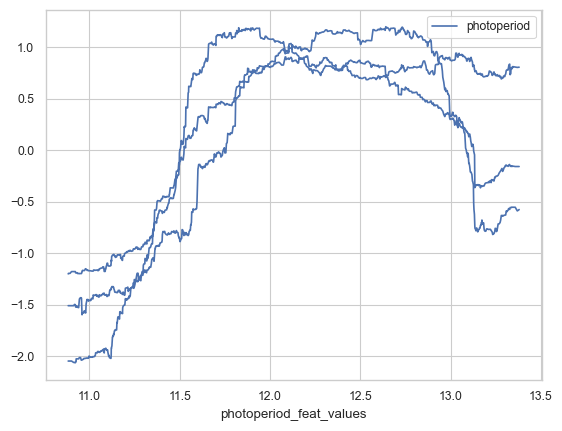

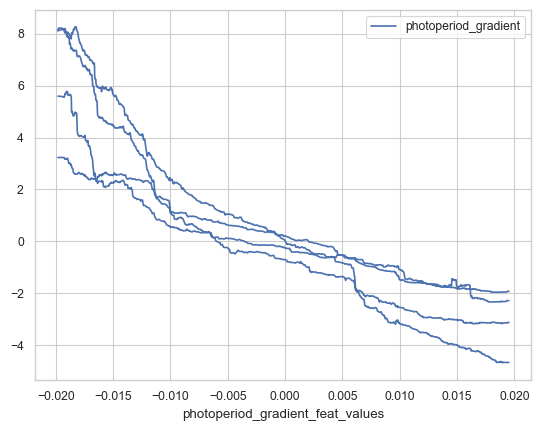

In [12]:
ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter'].plot(y = 'precip_90', x = 'precip_90_feat_values')
ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter'].plot(y = 'CO2', x = 'CO2_feat_values')
ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter'].plot(y = 'precip_365', x = 'precip_365_feat_values')
ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter'].plot(y = 'photoperiod', x = 'photoperiod_feat_values')
ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter'].plot(y = 'photoperiod_gradient', x = 'photoperiod_gradient_feat_values')

In [79]:
## Removing outliers 
# 1. Calculate Summary Stats 
# 2. Use the 1.5 of the IQR to find outliers 
# 3. Remove outliers 
# 4. Plot the ALE plots 

PV_ALE = ALE_all_models_df.loc[ALE_all_models_df['Target'] == 'pv_filter']
lower_q, upper_q = PV_ALE['precip_90_feat_values'].quantile([0.25, 0.75]) # get lower and upper quartiles 
iqr = upper_q - lower_q
lower_b, upper_b = np.maximum(0.0, lower_q - 1.5*iqr) , upper_q + 1.5*iqr # generate lower and upper bounds, however, limit the lower bounds to '0'

PV_ALE_removed_outlier = PV_ALE.loc[(PV_ALE['precip_90_feat_values'] >= lower_b) & (PV_ALE['precip_90_feat_values']  <= upper_b)]
PV_ALE_removed_outlier = PV_ALE_removed_outlier.sort_values(by = 'precip_90_feat_values')

<Axes: xlabel='precip_90_feat_values', ylabel='precip_90'>

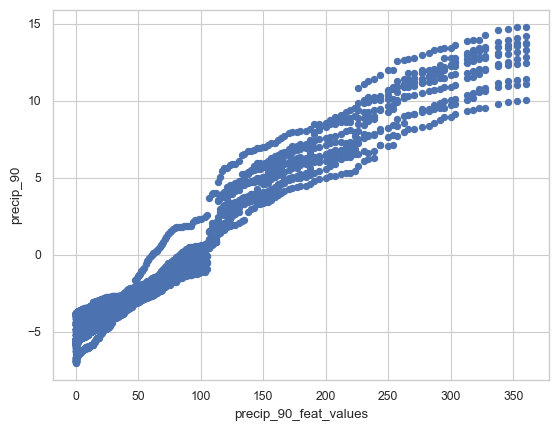

In [62]:
PV_ALE_removed_outlier.plot(x = 'precip_90_feat_values', y = 'precip_90', kind = 'scatter')

In [32]:
from pygam import LinearGAM, s

In [91]:
gam = LinearGAM(s(0)).fit(PV_ALE_removed_outlier['precip_90_feat_values'], 
                          PV_ALE_removed_outlier['precip_90'])


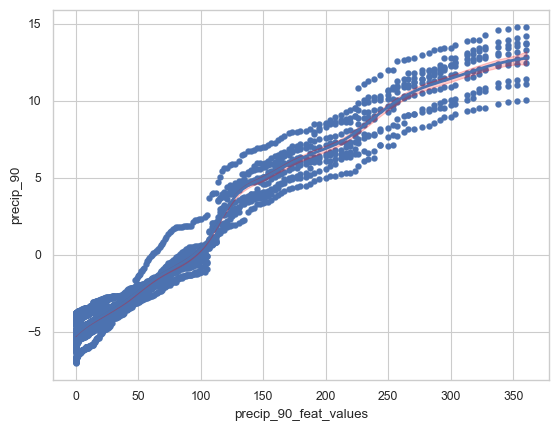

In [101]:
fig, axes = plt.subplots(1)


PV_ALE_removed_outlier.plot(x = 'precip_90_feat_values', y = 'precip_90', kind = 'scatter', ax = axes, linewidth = 0.1)

axes.plot(PV_ALE_removed_outlier['precip_90_feat_values'], gam.predict(PV_ALE_removed_outlier['precip_90_feat_values']), linewidth = 2)
confidence_intervals = gam.confidence_intervals(PV_ALE_removed_outlier['precip_90_feat_values'])
axes.fill_between(PV_ALE_removed_outlier['precip_90_feat_values'], confidence_intervals[:, 0],
                 confidence_intervals[:, 1], color='red', alpha=0.2, label='95% CI')



## Now testing for the three fractions

In [ ]:
## My implementation should include functions 

In [58]:
# Remove outlier via 1.5 * IQR method 

def remove_outliers_from_df(df, variable):
    lower_q, upper_q = df[variable].quantile([0.25, 0.75]) # get lower and upper quartiles 
    iqr = upper_q - lower_q
    lower_b, upper_b = np.maximum(0.0, lower_q - 1.5*iqr) , upper_q + 1.5*iqr # generate lower and upper bounds, however, limit the lower bounds to '0'
    
    return df.loc[(df[variable] >= lower_b) & (df[variable]  <= upper_b)]
    
def perform_gam(df, x, y):
    
    #print(df[x])
    #print(df[y])
    gam = LinearGAM().fit(df[x], df[y])
    gam_pred = gam.predict(df[x])
    conf_95 =  gam.confidence_intervals(df[x])
    
    return [gam_pred, conf_95]

In [59]:
veg_group_agg_importances_df = pd.read_csv(f'{results_dir}/Results_Visualisation/Aggregated_Importances.csv').set_index('Unnamed: 0')

In [60]:
veg_group_agg_importances_df

,0,group
Unnamed: 0,,
twi_1s,-7.306650e+00,Desert Chenopod
tmin_lag,-8.304576e-02,Desert Chenopod
fire_severity,-7.105427e-16,Desert Chenopod
tmax_7,0.000000e+00,Desert Chenopod
tmax_lag,0.000000e+00,Desert Chenopod
...,...,...
precip_30,1.120708e+01,Tropical/Savanna Tussock.grass
precip_365,1.465313e+01,Tropical/Savanna Tussock.grass
CO2,1.682621e+01,Tropical/Savanna Tussock.grass


In [70]:
SEASONAL_FEATURES = ['photoperiod', 'photoperiod_gradient']

PRECIP_FEATURES = ['precip_30', 'precip_90', 'precip_180', 
                   'precip_365', 'precip_730', 'precip_1095', 
                   'precip_1460']

MEAN_ANNUAL_CLIMATE_FEATURES = ['MAT', 'MAP']

TEMP_FEATURES = ['tmax_lag', 'tmax_7', 'tmax_14', 
                 'tmax_30', 'tmin_lag', 'tmin_7', 
                 'tmin_14', 'tmin_30']

VPD_FEATURES = ['VPD_lag','VPD_7', 'VPD_14',
                'VPD_30']

FIRE_FEATURES = ['days_since_fire', 'fire_severity']

CO2_FEATURES = ['CO2']

SOIL_FEATURES = ['SLGA_1','SLGA_2','SLGA_3', 'DER_000_999'] # the soil attributes to include

TOPOGRAPHIC_FEATURES = ['aspect_1s', 'twi_1s']

FEATURES =  SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES + SOIL_FEATURES + TOPOGRAPHIC_FEATURES

TEMPORAL_FEATURES = SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + CO2_FEATURES + TEMP_FEATURES
SPATIAL_FEATURES = SOIL_FEATURES + TOPOGRAPHIC_FEATURES + MEAN_ANNUAL_CLIMATE_FEATURES

TARGET = ['pv_filter', 'npv_filter', 'bs_filter']

In [71]:
# Now extract the most important variables from the variable importances 

veg_group_agg_spatial = veg_group_agg_importances_df.iloc[veg_group_agg_importances_df.index.isin(TEMPORAL_FEATURES)] # note I removed the fire variables 
top_5_variables = {}

groups = np.unique(veg_group_agg_spatial['group'])
for g in groups:
    veg_group_agg_group = veg_group_agg_spatial[veg_group_agg_spatial['group'] == g].sort_values('0', ascending = False)
    veg_group_agg_group = veg_group_agg_group.iloc[:5]
    top_5_variables[veg_group_agg_group['group'].values[0]] = list(veg_group_agg_group.index)
print(top_5_variables)

{'Desert Chenopod': ['CO2', 'precip_90', 'precip_365', 'VPD_30', 'precip_180'], 'Desert Forb': ['precip_90', 'VPD_30', 'CO2', 'tmax_14', 'tmin_7'], 'Desert Hummock.grass': ['CO2', 'precip_90', 'precip_365', 'precip_180', 'precip_730'], 'Desert Shrub': ['precip_90', 'CO2', 'photoperiod_gradient', 'photoperiod', 'precip_30'], 'Desert Tree.Palm': ['CO2', 'precip_90', 'photoperiod', 'precip_365', 'VPD_30'], 'Desert Tussock.grass': ['CO2', 'precip_90', 'photoperiod_gradient', 'precip_365', 'precip_30'], 'Temp/Med Shrub': ['photoperiod', 'CO2', 'precip_365', 'tmax_14', 'VPD_30'], 'Temp/Med Tree.Palm': ['photoperiod', 'precip_180', 'precip_365', 'photoperiod_gradient', 'tmax_lag'], 'Temp/Med Tussock.grass': ['CO2', 'tmax_30', 'VPD_30', 'precip_90', 'tmin_30'], 'Tropical/Savanna Tree.Palm': ['precip_90', 'CO2', 'precip_30', 'photoperiod_gradient', 'precip_180'], 'Tropical/Savanna Tussock.grass': ['precip_90', 'CO2', 'precip_365', 'precip_30', 'precip_180']}


In [72]:
## Now adjusting the ordering to which we plot the 5 most important variables 

desert_variables = []
non_desert_variables = []
for i, v in top_5_variables.items():
    if i.split(' ')[0] == 'Desert':
        for var in v:
            desert_variables.append(var)
    else:
        for var in v:
            non_desert_variables.append(var)

In [73]:
ordering_desert = pd.Series(desert_variables).value_counts().index.values # base the order on the most frequent variable in the tally

In [74]:
ordering_desert

array(['CO2', 'precip_90', 'precip_365', 'VPD_30', 'precip_180',
       'photoperiod_gradient', 'photoperiod', 'precip_30', 'tmax_14',
       'tmin_7', 'precip_730'], dtype=object)

In [75]:
ordering_non_desert = pd.Series(non_desert_variables).value_counts().index.values
ordering_non_desert

array(['CO2', 'precip_365', 'precip_180', 'precip_90', 'photoperiod',
       'VPD_30', 'photoperiod_gradient', 'precip_30', 'tmax_14',
       'tmax_lag', 'tmax_30', 'tmin_30'], dtype=object)

## Temporal Desert

0
CO2_feat_values
0
precip_90_feat_values
0
skip VPD_30
VPD_30_feat_values
0
skip precip_180
skip photoperiod_gradient
skip photoperiod
skip precip_30
skip tmax_14
tmax_14_feat_values
0
skip photoperiod_gradient
skip photoperiod
skip precip_30
skip tmax_14
skip tmin_7
tmin_7_feat_values
1
CO2_feat_values
1
precip_90_feat_values
1
precip_365_feat_values
1
VPD_30_feat_values
1
precip_180_feat_values
2
CO2_feat_values
2
precip_90_feat_values
2
precip_365_feat_values
2
skip precip_180
precip_180_feat_values
2
skip photoperiod_gradient
skip photoperiod
skip precip_30
skip tmax_14
skip tmin_7
skip precip_730
precip_730_feat_values
3
CO2_feat_values
3
precip_90_feat_values
3
precip_365_feat_values
3
VPD_30_feat_values
3
skip photoperiod_gradient
skip photoperiod
photoperiod_feat_values
4
CO2_feat_values
4
precip_90_feat_values
4
skip VPD_30
skip precip_180
skip photoperiod_gradient
photoperiod_gradient_feat_values
4
skip precip_180
skip photoperiod_gradient
skip photoperiod
photoperiod_feat_v

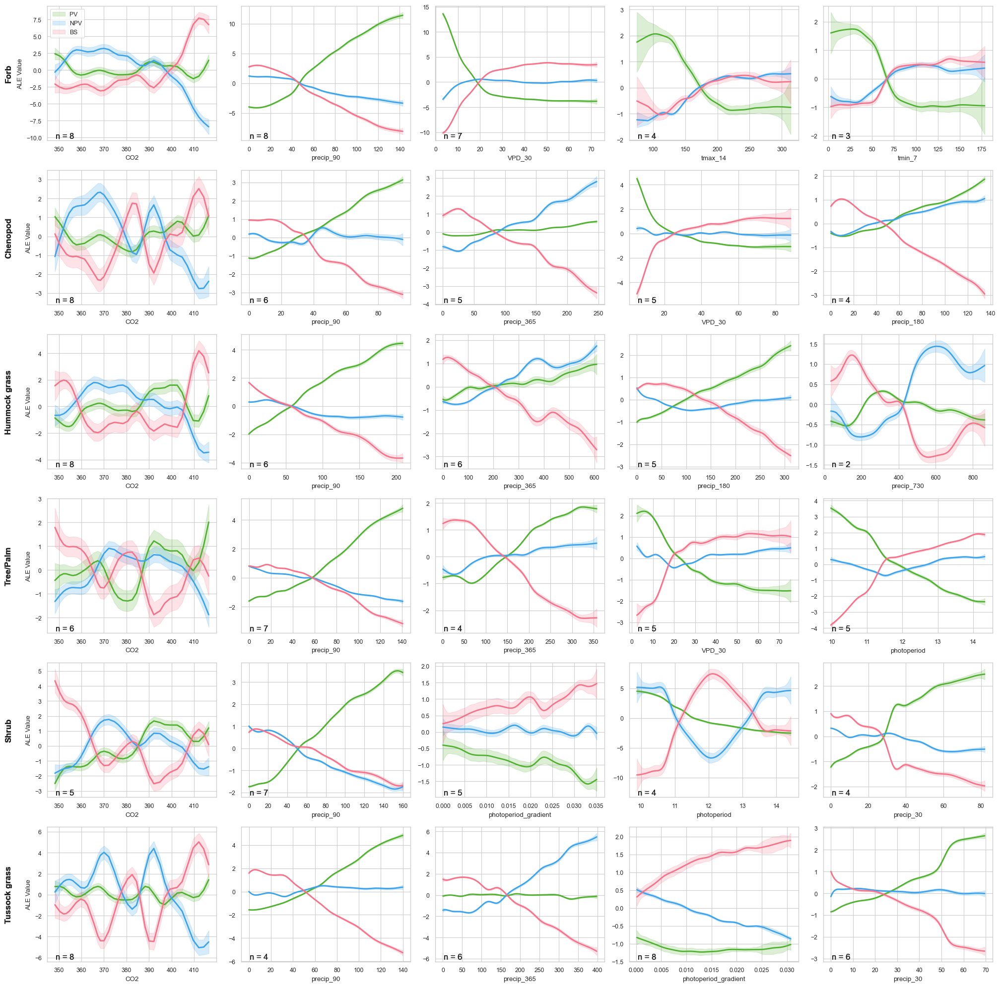

In [69]:
ncols = 5
nrows = 6
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (20, 20))

ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass']

# ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
#                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
#                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
#                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

color_palette = [list(sns.color_palette("husl", 3))[1], list(sns.color_palette("husl", 3))[2], list(sns.color_palette("husl", 3))[0]]

# Iterate by plot grid ~ ncols corresponds to the number of variables to plot
#                      ~ nrows corresponds to the number of veg group to plot 

taken_variable = []
veg_group_idx = 0
for i, ax in enumerate(axes.flat):
    
    
    # Set the veg group index
    #print(i % ncols)
   
    if i % ncols == 0 and i != 0:
        veg_group_idx += 1
        taken_variable = []
    print(veg_group_idx)
    
    # Read in the data and set the variable group 
    veg_group = ordered_veg_list[veg_group_idx]
    super_group_folder_name = '_'.join(veg_group.split('/')) 
    ALE_all_models_df = pd.read_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')
    
    # Set the variable index
    
    possessed_variables = top_5_variables[veg_group]
    variable_col = i % ncols
    variable_priority = ordering_desert[variable_col]
    
    while variable_priority not in possessed_variables or variable_priority in taken_variable:
        variable_col += 1
        variable_priority = ordering_desert[variable_col]
        print(f'skip {variable_priority}')
        
    taken_variable.append(variable_priority)
    
    
    x_variable = variable_priority + '_feat_values'
    y_variable = variable_priority
    print(x_variable)

    # Iterate by fractional cover type 
    for color_idx, fraction in enumerate(TARGET):

        # Remove outliers in the x_variable 
        #print(ALE_all_models_df)
        fraction_ALE = ALE_all_models_df.loc[ALE_all_models_df['Target'] == fraction][[x_variable, y_variable, 'Model']].dropna()
        fraction_ALE_removed_outlier = remove_outliers_from_df(fraction_ALE, x_variable).sort_values(x_variable)

        # Perform gam
        gam_pred, conf_95 = perform_gam(fraction_ALE_removed_outlier, x_variable, y_variable)

        # Plotting the gam

        ax.plot(fraction_ALE_removed_outlier[x_variable], gam_pred, linewidth = 2, color = color_palette[color_idx])
        ax.fill_between(fraction_ALE_removed_outlier[x_variable], conf_95[:, 0],
                         conf_95[:, 1], alpha=0.2, label='95% CI', color = color_palette[color_idx])

        ax.set_xlabel(y_variable)
        
        veg_name = ' '.join(super_group_folder_name.split(" ")[1].split('.'))
        if veg_name == 'Tree Palm':
            veg_name = 'Tree/Palm'
        
        if i % ncols == 0:
            ax.set_ylabel('ALE Value')
            ax.text(-0.25, 0.5, veg_name,
                    transform=ax.transAxes, fontsize=12,
                    fontweight='bold', rotation=90,
                    va = 'center')

        if i == 0:
            handles = ax.get_legend_handles_labels()[0]
            new_labels = ['PV', 'NPV', 'BS']
            ax.legend(handles, new_labels)
            
        # Annotation
        number_of_models = len(np.unique(fraction_ALE_removed_outlier['Model']))
        ax.text(0.05, 0.06, f'n = {number_of_models}', transform=ax.transAxes, 
            fontsize=12, va='top')
        

plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Deserts_ALE_Dependence_Plots.png')

## Temporal Non Desert

0
Temp_Med Tree.Palm
skip precip_365
precip_365_feat_values
0
Temp_Med Tree.Palm
skip precip_180
precip_180_feat_values
0
Temp_Med Tree.Palm
skip precip_90
skip photoperiod
photoperiod_feat_values
0
Temp_Med Tree.Palm
skip photoperiod
skip VPD_30
skip photoperiod_gradient
photoperiod_gradient_feat_values
0
Temp_Med Tree.Palm
skip VPD_30
skip photoperiod_gradient
skip precip_30
skip tmax_14
skip tmax_lag
tmax_lag_feat_values
1
Temp_Med Shrub
CO2_feat_values
1
Temp_Med Shrub
precip_365_feat_values
1
Temp_Med Shrub
skip precip_90
skip photoperiod
photoperiod_feat_values
1
Temp_Med Shrub
skip photoperiod
skip VPD_30
VPD_30_feat_values
1
Temp_Med Shrub
skip VPD_30
skip photoperiod_gradient
skip precip_30
skip tmax_14
tmax_14_feat_values
2
Temp_Med Tussock.grass
CO2_feat_values
2
Temp_Med Tussock.grass
skip precip_180
skip precip_90
precip_90_feat_values
2
Temp_Med Tussock.grass
skip precip_90
skip photoperiod
skip VPD_30
VPD_30_feat_values
2
Temp_Med Tussock.grass
skip photoperiod
skip VPD_

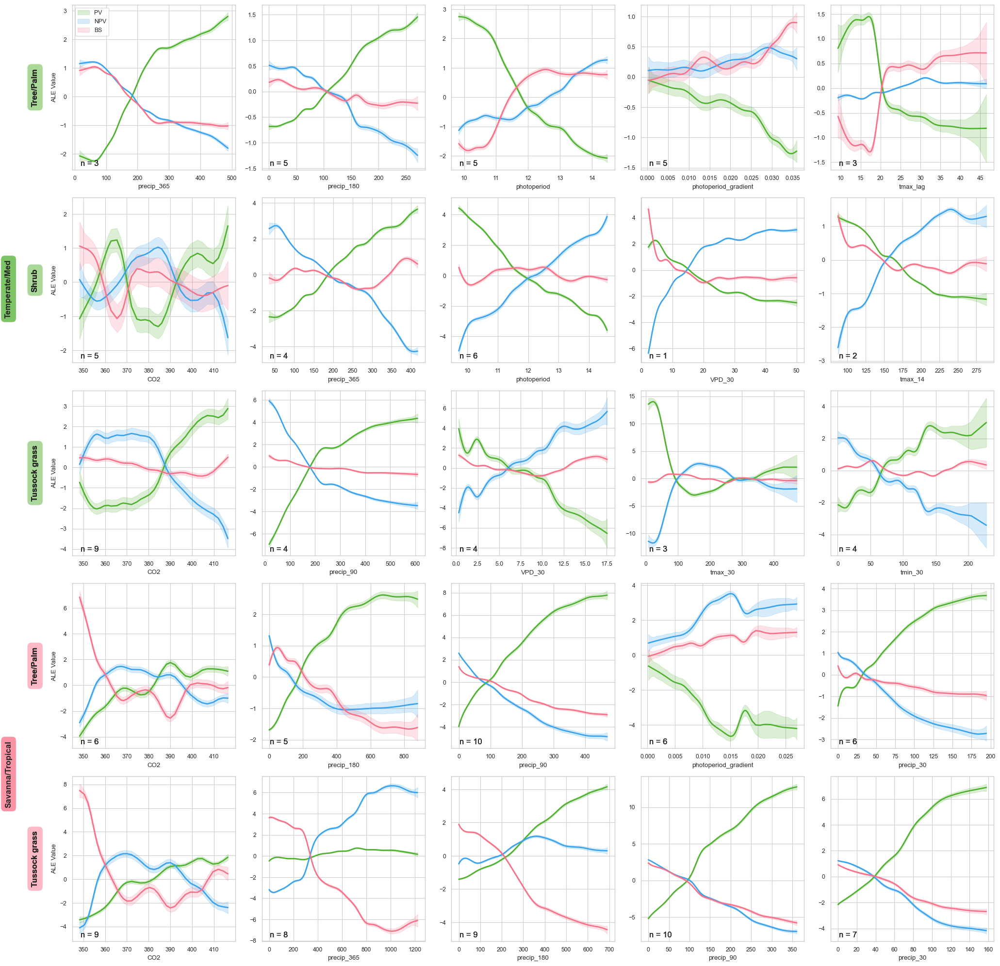

In [124]:
ncols = 5
nrows = 5
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (20, 20))

ordered_veg_list = ['Temp/Med Tree.Palm',          'Temp/Med Shrub',  
                    'Temp/Med Tussock.grass',      'Tropical/Savanna Tree.Palm', 
                    'Tropical/Savanna Tussock.grass']

color_palette = [list(sns.color_palette("husl", 3))[1], list(sns.color_palette("husl", 3))[2], list(sns.color_palette("husl", 3))[0]]

# Iterate by plot grid ~ ncols corresponds to the number of variables to plot
#                      ~ nrows corresponds to the number of veg group to plot 

# Add box for temp/Med
fig.text(-0.025, 0.70, 'Temperate/Med', fontsize=12, va='center', ha='center',
         bbox=dict(facecolor= color_palette[0], alpha=0.75, boxstyle="round,pad=0.5"), rotation=90, fontweight='bold')
#rect = Rectangle((-0.060, 0.4), 0.075, 0.60, transform=fig.transFigure,
#                 color= color_palette[0], alpha=0.5)
#fig.patches.append(rect)

# Add box for savanna/tropical
fig.text(-0.025, 0.20, 'Savanna/Tropical', fontsize=12, va='center', ha='center',
         bbox=dict(facecolor= color_palette[2], alpha=0.75, boxstyle="round,pad=0.5"), rotation=90, fontweight='bold')
#rect = Rectangle((-0.060, 0.0), 0.075, 0.40, transform=fig.transFigure,
#                 color= color_palette[2], alpha=0.5)
#fig.patches.append(rect)


taken_variable = []
veg_group_idx = 0
for i, ax in enumerate(axes.flat):
    
    
    # Set the veg group index
    #print(i % ncols)
   
    if i % ncols == 0 and i != 0:
        veg_group_idx += 1
        taken_variable = []
    
    
    # Read in the data and set the variable group 
    veg_group = ordered_veg_list[veg_group_idx]
    super_group_folder_name = '_'.join(veg_group.split('/')) 
    ALE_all_models_df = pd.read_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')
    
    print(veg_group_idx)
    print(super_group_folder_name)
    # Set the variable index
    possessed_variables = top_5_variables[veg_group]
    variable_col = i % ncols
    variable_priority = ordering_non_desert[variable_col]
    
    while variable_priority not in possessed_variables or variable_priority in taken_variable:
        variable_col += 1
        variable_priority = ordering_non_desert[variable_col]
        print(f'skip {variable_priority}')
        
    taken_variable.append(variable_priority)
    
    
    x_variable = variable_priority + '_feat_values'
    y_variable = variable_priority
    print(x_variable)

    # Iterate by fractional cover type 
    for color_idx, fraction in enumerate(TARGET):

        # Remove outliers in the x_variable 
        #print(ALE_all_models_df)
        fraction_ALE = ALE_all_models_df.loc[ALE_all_models_df['Target'] == fraction][[x_variable, y_variable, 'Model']].dropna()
        fraction_ALE_removed_outlier = remove_outliers_from_df(fraction_ALE, x_variable).sort_values(x_variable)

        # Perform gam
        gam_pred, conf_95 = perform_gam(fraction_ALE_removed_outlier, x_variable, y_variable)

        # Plotting the gam

        ax.plot(fraction_ALE_removed_outlier[x_variable], gam_pred, linewidth = 2, color = color_palette[color_idx])
        ax.fill_between(fraction_ALE_removed_outlier[x_variable], conf_95[:, 0],
                         conf_95[:, 1], alpha=0.2, label='95% CI', color = color_palette[color_idx])

        ax.set_xlabel(y_variable)
        
        veg_name = ' '.join(super_group_folder_name.split(" ")[1].split('.'))
        if veg_name == 'Tree Palm':
            veg_name = 'Tree/Palm'
        
        if i % ncols == 0:
            ax.set_ylabel('ALE Value')       
            
            # Annotation
            if veg_group.split(' ')[0] == 'Temp/Med':
                col_pal = color_palette[0]
            else:
                col_pal = color_palette[2]
                
            ax.text(-0.25, 0.5, veg_name,
                    transform=ax.transAxes, fontsize=12,
                    fontweight='bold', rotation=90,
                    va = 'center', bbox=dict(facecolor= col_pal, alpha=0.2,boxstyle="round,pad=0.5"))

        if i == 0:
            handles = ax.get_legend_handles_labels()[0]
            new_labels = ['PV', 'NPV', 'BS']
            ax.legend(handles, new_labels)
            

        
        number_of_models = len(np.unique(fraction_ALE_removed_outlier['Model']))
        ax.text(0.05, 0.06, f'n = {number_of_models}', transform=ax.transAxes, 
            fontsize=12, va='top')
        


# Plot and save plot
plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_NonDeserts_ALE_Dependence_Plots.png')

## Now looking at spatial

In [32]:
# Remove outlier via 1.5 * IQR method 

def remove_outliers_from_df(df, variable):
    lower_q, upper_q = df[variable].quantile([0.25, 0.75]) # get lower and upper quartiles 
    iqr = upper_q - lower_q
    lower_b, upper_b = np.maximum(0.0, lower_q - 1.5*iqr) , upper_q + 1.5*iqr # generate lower and upper bounds, however, limit the lower bounds to '0'
    
    return df.loc[(df[variable] >= lower_b) & (df[variable]  <= upper_b)]
    
def perform_gam(df, x, y):
    
    #print(df[x])
    #print(df[y])
    gam = LinearGAM().fit(df[x], df[y])
    gam_pred = gam.predict(df[x])
    conf_95 =  gam.confidence_intervals(df[x])
    
    return [gam_pred, conf_95]

In [33]:
veg_group_agg_importances_df = pd.read_csv(f'{results_dir}/Results_Visualisation/Aggregated_Importances.csv').set_index('Unnamed: 0')

In [34]:
veg_group_agg_importances_df

,0,group
Unnamed: 0,,
twi_1s,-7.306650e+00,Desert Chenopod
tmin_lag,-8.304576e-02,Desert Chenopod
fire_severity,-7.105427e-16,Desert Chenopod
tmax_7,0.000000e+00,Desert Chenopod
tmax_lag,0.000000e+00,Desert Chenopod
...,...,...
precip_30,1.120708e+01,Tropical/Savanna Tussock.grass
precip_365,1.465313e+01,Tropical/Savanna Tussock.grass
CO2,1.682621e+01,Tropical/Savanna Tussock.grass


In [35]:
SEASONAL_FEATURES = ['photoperiod', 'photoperiod_gradient']

PRECIP_FEATURES = ['precip_30', 'precip_90', 'precip_180', 
                   'precip_365', 'precip_730', 'precip_1095', 
                   'precip_1460']

MEAN_ANNUAL_CLIMATE_FEATURES = ['MAT', 'MAP']

TEMP_FEATURES = ['tmax_lag', 'tmax_7', 'tmax_14', 
                 'tmax_30', 'tmin_lag', 'tmin_7', 
                 'tmin_14', 'tmin_30']

VPD_FEATURES = ['VPD_lag','VPD_7', 'VPD_14',
                'VPD_30']

FIRE_FEATURES = ['days_since_fire', 'fire_severity']

CO2_FEATURES = ['CO2']

SOIL_FEATURES = ['SLGA_1','SLGA_2','SLGA_3', 'DER_000_999'] # the soil attributes to include

TOPOGRAPHIC_FEATURES = ['aspect_1s', 'twi_1s']

FEATURES =  SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + FIRE_FEATURES + CO2_FEATURES + TEMP_FEATURES + SOIL_FEATURES + TOPOGRAPHIC_FEATURES

TEMPORAL_FEATURES = SEASONAL_FEATURES + PRECIP_FEATURES + VPD_FEATURES + CO2_FEATURES + TEMP_FEATURES
SPATIAL_FEATURES = SOIL_FEATURES + TOPOGRAPHIC_FEATURES + MEAN_ANNUAL_CLIMATE_FEATURES

TARGET = ['pv_filter', 'npv_filter', 'bs_filter']

In [36]:
# Now extract the most important variables from the variable importances 

veg_group_agg_spatial = veg_group_agg_importances_df.iloc[veg_group_agg_importances_df.index.isin(SPATIAL_FEATURES)] # note I removed the fire variables 
top_5_variables = {}

groups = np.unique(veg_group_agg_spatial['group'])
for g in groups:
    veg_group_agg_group = veg_group_agg_spatial[veg_group_agg_spatial['group'] == g].sort_values('0', ascending = False)
    veg_group_agg_group = veg_group_agg_group.iloc[:5]
    top_5_variables[veg_group_agg_group['group'].values[0]] = list(veg_group_agg_group.index)
print(top_5_variables)

{'Desert Chenopod': ['SLGA_3', 'MAT', 'aspect_1s', 'SLGA_2', 'DER_000_999'], 'Desert Forb': ['MAT', 'SLGA_3', 'aspect_1s', 'twi_1s', 'SLGA_2'], 'Desert Hummock.grass': ['MAP', 'MAT', 'SLGA_3', 'SLGA_1', 'aspect_1s'], 'Desert Shrub': ['MAP', 'SLGA_3', 'DER_000_999', 'aspect_1s', 'twi_1s'], 'Desert Tree.Palm': ['MAT', 'MAP', 'aspect_1s', 'SLGA_2', 'twi_1s'], 'Desert Tussock.grass': ['MAT', 'MAP', 'twi_1s', 'SLGA_1', 'SLGA_3'], 'Temp/Med Shrub': ['MAP', 'SLGA_2', 'SLGA_1', 'SLGA_3', 'aspect_1s'], 'Temp/Med Tree.Palm': ['MAP', 'MAT', 'SLGA_1', 'twi_1s', 'SLGA_3'], 'Temp/Med Tussock.grass': ['MAP', 'SLGA_2', 'MAT', 'SLGA_3', 'DER_000_999'], 'Tropical/Savanna Tree.Palm': ['MAP', 'SLGA_3', 'SLGA_2', 'twi_1s', 'MAT'], 'Tropical/Savanna Tussock.grass': ['MAP', 'SLGA_1', 'SLGA_2', 'MAT', 'aspect_1s']}


In [37]:
## Now adjusting the ordering to which we plot the 5 most important variables 

desert_variables = []
non_desert_variables = []
for i, v in top_5_variables.items():
    if i.split(' ')[0] == 'Desert':
        for var in v:
            desert_variables.append(var)
    else:
        for var in v:
            non_desert_variables.append(var)

In [38]:
ordering_desert = pd.Series(desert_variables).value_counts().index.values # base the order on the most frequent variable in the tally

In [39]:
ordering_desert

array(['SLGA_3', 'MAT', 'aspect_1s', 'twi_1s', 'MAP', 'SLGA_2',
       'DER_000_999', 'SLGA_1'], dtype=object)

In [40]:
ordering_non_desert = pd.Series(non_desert_variables).value_counts().index.values
ordering_non_desert

array(['MAP', 'SLGA_2', 'SLGA_3', 'MAT', 'SLGA_1', 'aspect_1s', 'twi_1s',
       'DER_000_999'], dtype=object)

## Spatial Desert

0
SLGA_3_feat_values
0
MAT_feat_values
0
aspect_1s_feat_values
0
twi_1s_feat_values
0
skip SLGA_2
SLGA_2_feat_values
1
SLGA_3_feat_values
1
MAT_feat_values
1
aspect_1s_feat_values
1
skip MAP
skip SLGA_2
SLGA_2_feat_values
1
skip SLGA_2
skip DER_000_999
DER_000_999_feat_values
2
SLGA_3_feat_values
2
MAT_feat_values
2
aspect_1s_feat_values
2
skip MAP
MAP_feat_values
2
skip SLGA_2
skip DER_000_999
skip SLGA_1
SLGA_1_feat_values
3
skip MAT
MAT_feat_values
3
skip aspect_1s
aspect_1s_feat_values
3
skip twi_1s
twi_1s_feat_values
3
skip MAP
MAP_feat_values
3
skip SLGA_2
SLGA_2_feat_values
4
SLGA_3_feat_values
4
skip aspect_1s
aspect_1s_feat_values
4
skip twi_1s
twi_1s_feat_values
4
skip MAP
MAP_feat_values
4
skip SLGA_2
skip DER_000_999
DER_000_999_feat_values
5
SLGA_3_feat_values
5
MAT_feat_values
5
skip twi_1s
twi_1s_feat_values
5
skip MAP
MAP_feat_values
5
skip SLGA_2
skip DER_000_999
skip SLGA_1
SLGA_1_feat_values


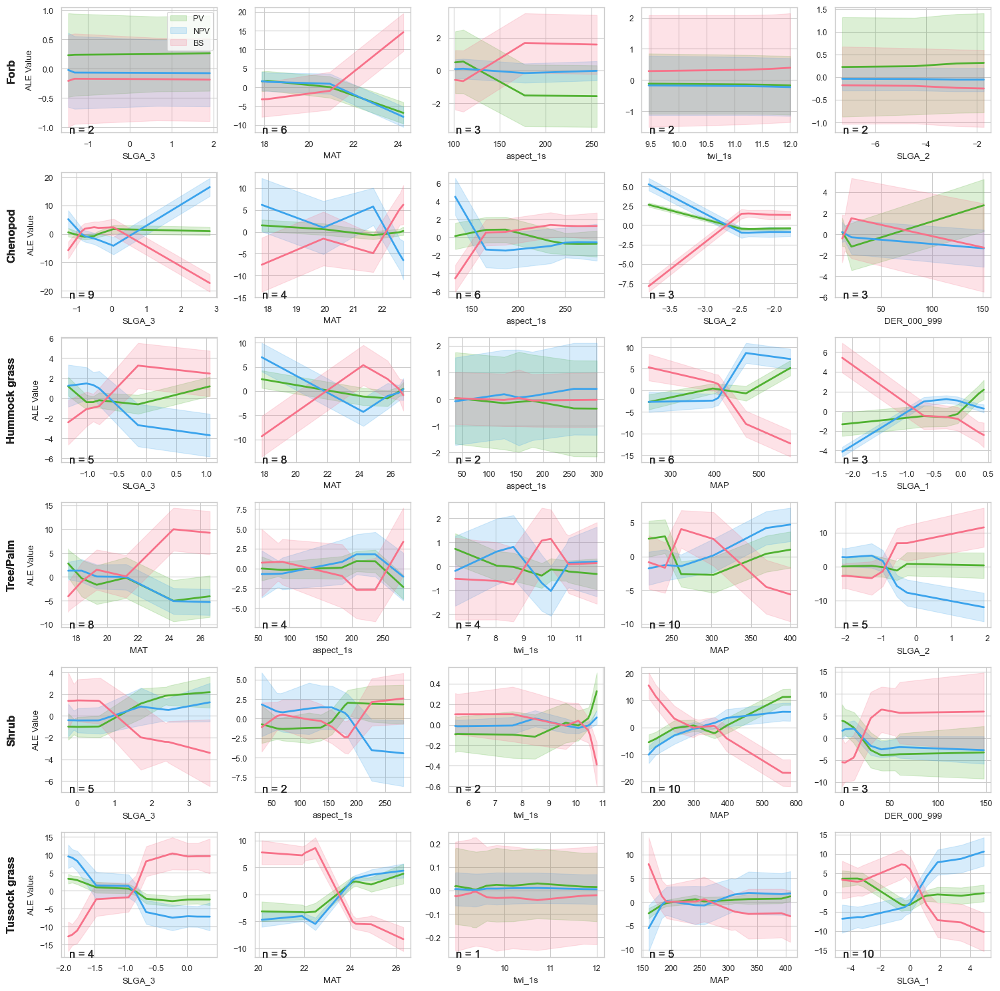

In [56]:


ncols = 5
nrows = 6
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (15, 15))

ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass']

# ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
#                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
#                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
#                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

color_palette = [list(sns.color_palette("husl", 3))[1], list(sns.color_palette("husl", 3))[2], list(sns.color_palette("husl", 3))[0]]

# Iterate by plot grid ~ ncols corresponds to the number of variables to plot
#                      ~ nrows corresponds to the number of veg group to plot 

taken_variable = []
veg_group_idx = 0
for i, ax in enumerate(axes.flat):
    
    
    # Set the veg group index
    #print(i % ncols)
   
    if i % ncols == 0 and i != 0:
        veg_group_idx += 1
        taken_variable = []
    print(veg_group_idx)
    
    # Read in the data and set the variable group 
    veg_group = ordered_veg_list[veg_group_idx]
    super_group_folder_name = '_'.join(veg_group.split('/')) 
    ALE_all_models_df = pd.read_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')
    
    # Set the variable index
    
    possessed_variables = top_5_variables[veg_group]
    variable_col = i % ncols
    variable_priority = ordering_desert[variable_col]
    
    while variable_priority not in possessed_variables or variable_priority in taken_variable:
        variable_col += 1
        variable_priority = ordering_desert[variable_col]
        print(f'skip {variable_priority}')
        
    taken_variable.append(variable_priority)
    
    
    x_variable = variable_priority + '_feat_values'
    y_variable = variable_priority
    print(x_variable)

    # Iterate by fractional cover type 
    for color_idx, fraction in enumerate(TARGET):

        # Remove outliers in the x_variable 
        #print(ALE_all_models_df)
        fraction_ALE = ALE_all_models_df.loc[ALE_all_models_df['Target'] == fraction][[x_variable, y_variable, 'Model']].dropna()
        fraction_ALE_removed_outlier = fraction_ALE.sort_values(x_variable)

        # Perform gam
        gam_pred, conf_95 = perform_gam(fraction_ALE_removed_outlier, x_variable, y_variable)

        # Plotting the gam

        ax.plot(fraction_ALE_removed_outlier[x_variable], gam_pred, linewidth = 2, color = color_palette[color_idx])
        ax.fill_between(fraction_ALE_removed_outlier[x_variable], conf_95[:, 0],
                         conf_95[:, 1], alpha=0.2, label='95% CI', color = color_palette[color_idx])

        ax.set_xlabel(y_variable)
        
        veg_name = ' '.join(super_group_folder_name.split(" ")[1].split('.'))
        if veg_name == 'Tree Palm':
            veg_name = 'Tree/Palm'
        
        if i % ncols == 0:
            ax.set_ylabel('ALE Value')
            ax.text(-0.35, 0.5, veg_name,
                    transform=ax.transAxes, fontsize=12,
                    fontweight='bold', rotation=90,
                    va = 'center')

        if i == 0:
            handles = ax.get_legend_handles_labels()[0]
            new_labels = ['PV', 'NPV', 'BS']
            ax.legend(handles, new_labels)
            
        # Annotation
        number_of_models = len(np.unique(fraction_ALE_removed_outlier['Model']))
        ax.text(0.05, 0.06, f'n = {number_of_models}', transform=ax.transAxes, 
            fontsize=12, va='top')
        

plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Spatial_Deserts_ALE_Dependence_Plots.png')

## Spatial Non Desert

0
MAP_feat_values
0
skip SLGA_3
SLGA_3_feat_values
0
skip MAT
MAT_feat_values
0
skip SLGA_1
SLGA_1_feat_values
0
skip aspect_1s
skip twi_1s
twi_1s_feat_values
1
MAP_feat_values
1
SLGA_2_feat_values
1
SLGA_3_feat_values
1
skip SLGA_1
SLGA_1_feat_values
1
skip aspect_1s
aspect_1s_feat_values
2
MAP_feat_values
2
SLGA_2_feat_values
2
SLGA_3_feat_values
2
MAT_feat_values
2
skip aspect_1s
skip twi_1s
skip DER_000_999
DER_000_999_feat_values
3
MAP_feat_values
3
SLGA_2_feat_values
3
SLGA_3_feat_values
3
MAT_feat_values
3
skip aspect_1s
skip twi_1s
twi_1s_feat_values
4
MAP_feat_values
4
SLGA_2_feat_values
4
skip MAT
MAT_feat_values
4
skip SLGA_1
SLGA_1_feat_values
4
skip aspect_1s
aspect_1s_feat_values


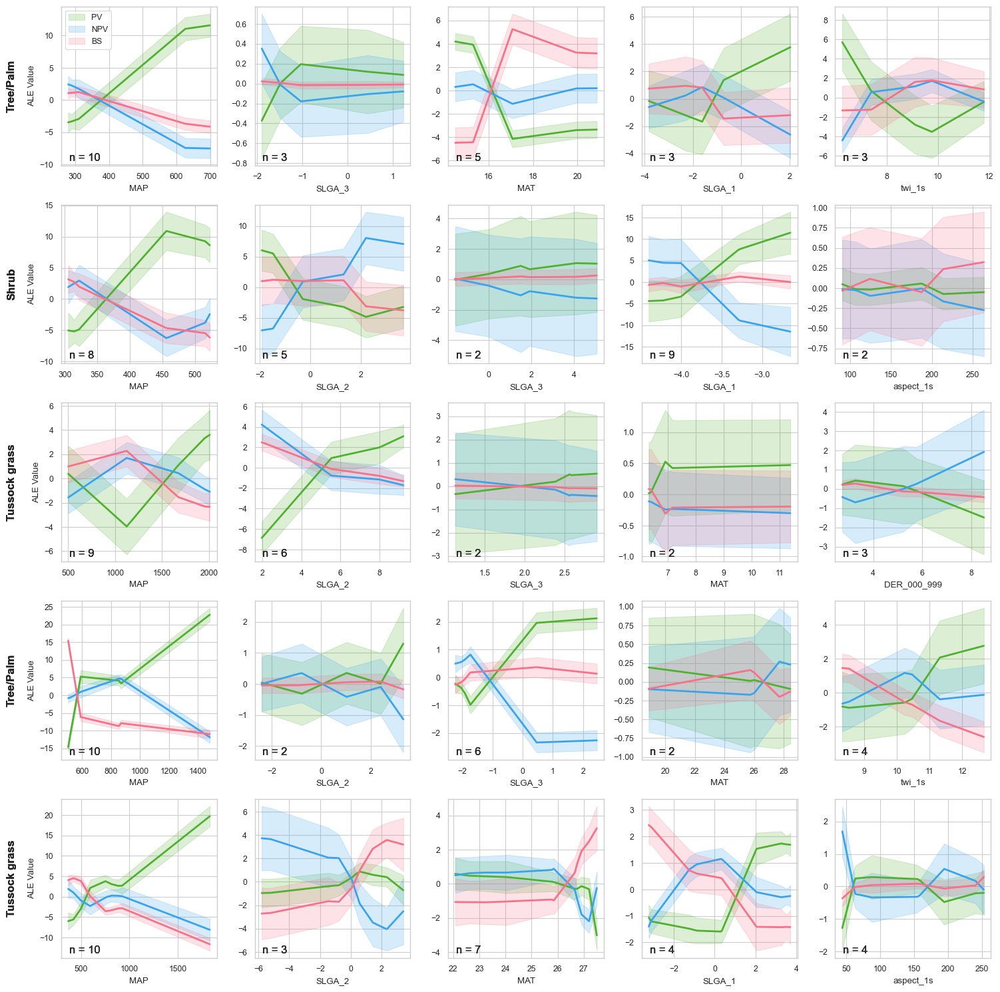

In [55]:


ncols = 5
nrows = 5
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (15, 15))

ordered_veg_list = ['Temp/Med Tree.Palm',          'Temp/Med Shrub',  
                    'Temp/Med Tussock.grass',      'Tropical/Savanna Tree.Palm', 
                    'Tropical/Savanna Tussock.grass']

# ordered_veg_list = ['Desert Forb',                 'Desert Chenopod', 'Desert Hummock.grass',
#                    'Desert Tree.Palm',            'Desert Shrub',    'Desert Tussock.grass',
#                    'Temp/Med Tree.Palm',          'Temp/Med Shrub',  'Temp/Med Tussock.grass',
#                    'Tropical/Savanna Tree.Palm',  'Tropical/Savanna Tussock.grass']

color_palette = [list(sns.color_palette("husl", 3))[1], list(sns.color_palette("husl", 3))[2], list(sns.color_palette("husl", 3))[0]]

# Iterate by plot grid ~ ncols corresponds to the number of variables to plot
#                      ~ nrows corresponds to the number of veg group to plot 

# Add box for temp/Med
fig.text(-0.025, 0.70, 'Temperate/Med', fontsize=12, va='center', ha='center',
         bbox=dict(facecolor= color_palette[0], alpha=0.75, boxstyle="round,pad=0.5"), rotation=90, fontweight='bold')
#rect = Rectangle((-0.060, 0.4), 0.075, 0.60, transform=fig.transFigure,
#                 color= color_palette[0], alpha=0.5)
#fig.patches.append(rect)

# Add box for savanna/tropical
fig.text(-0.025, 0.20, 'Savanna/Tropical', fontsize=12, va='center', ha='center',
         bbox=dict(facecolor= color_palette[2], alpha=0.75, boxstyle="round,pad=0.5"), rotation=90, fontweight='bold')
#rect = Rectangle((-0.060, 0.0), 0.075, 0.40, transform=fig.transFigure,
#                 color= color_palette[2], alpha=0.5)
#fig.patches.append(rect)
# Iterate by plot grid ~ ncols corresponds to the number of variables to plot
#                      ~ nrows corresponds to the number of veg group to plot 

taken_variable = []
veg_group_idx = 0
for i, ax in enumerate(axes.flat):
    
    
    # Set the veg group index
    #print(i % ncols)
   
    if i % ncols == 0 and i != 0:
        veg_group_idx += 1
        taken_variable = []
    print(veg_group_idx)
    
    # Read in the data and set the variable group 
    veg_group = ordered_veg_list[veg_group_idx]
    super_group_folder_name = '_'.join(veg_group.split('/')) 
    ALE_all_models_df = pd.read_csv(f'{results_dir}/Results_Visualisation/ALE_values_{super_group_folder_name}.csv')
    
    # Set the variable index
    
    possessed_variables = top_5_variables[veg_group]
    variable_col = i % ncols
    variable_priority = ordering_non_desert[variable_col]
    
    while variable_priority not in possessed_variables or variable_priority in taken_variable:
        variable_col += 1
        variable_priority = ordering_non_desert[variable_col]
        print(f'skip {variable_priority}')
        
    taken_variable.append(variable_priority)
    
    
    x_variable = variable_priority + '_feat_values'
    y_variable = variable_priority
    print(x_variable)

    # Iterate by fractional cover type 
    for color_idx, fraction in enumerate(TARGET):

        # Remove outliers in the x_variable 
        #print(ALE_all_models_df)
        fraction_ALE = ALE_all_models_df.loc[ALE_all_models_df['Target'] == fraction][[x_variable, y_variable, 'Model']].dropna()
        fraction_ALE_removed_outlier = fraction_ALE.sort_values(x_variable)

        # Perform gam
        gam_pred, conf_95 = perform_gam(fraction_ALE_removed_outlier, x_variable, y_variable)

        # Plotting the gam

        ax.plot(fraction_ALE_removed_outlier[x_variable], gam_pred, linewidth = 2, color = color_palette[color_idx])
        ax.fill_between(fraction_ALE_removed_outlier[x_variable], conf_95[:, 0],
                         conf_95[:, 1], alpha=0.2, label='95% CI', color = color_palette[color_idx])

        ax.set_xlabel(y_variable)
        
        veg_name = ' '.join(super_group_folder_name.split(" ")[1].split('.'))
        if veg_name == 'Tree Palm':
            veg_name = 'Tree/Palm'
        
        if i % ncols == 0:
            ax.set_ylabel('ALE Value')
            ax.text(-0.35, 0.5, veg_name,
                    transform=ax.transAxes, fontsize=12,
                    fontweight='bold', rotation=90,
                    va = 'center')

        if i == 0:
            handles = ax.get_legend_handles_labels()[0]
            new_labels = ['PV', 'NPV', 'BS']
            ax.legend(handles, new_labels)
            
        # Annotation
        number_of_models = len(np.unique(fraction_ALE_removed_outlier['Model']))
        ax.text(0.05, 0.08, f'n = {number_of_models}', transform=ax.transAxes, 
            fontsize=12, va='top')
        

plt.tight_layout()
fig.savefig(f'{plots_dir}/Total_Spatial_NonDeserts_ALE_Dependence_Plots.png')